# Applied Finance Information Systems - Section 501 Group 5 Final Project

a. maFast = 21<br>
b. maSlow = 235<br>
c. bbWindow = 56<br>
d. bbStdevBand = 3<br>
e. In Alphabetical Order - <br> myStrategies = [AAPL-MAFlat, AMZN-MAFlat, ATT-BB, EUR-BB, GE-MAShort, LEHM-BMK-MA, SILVER-MAShort, SPY-MAFlat]

In [1]:
# Importing libraries

%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.ticker as mtick # for the last few efficient frontier plots
aspect_ratio = (12, 8) # if plotting inline
# aspect_ratio = (8, 5) # if plotting in separate windows using qt
annualization_factor=260
from itertools import product
import itertools
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from statsmodels.regression.rolling import RollingOLS

## Loading Important Functions

### Technical Trading functions

In [2]:
def movingAverageCrossover(df,fastWindow,slowWindow):
    if df.columns.size>1:
        raise ValueError("More than one column detected");
        return;
    if fastWindow>slowWindow:
        raise ValueError("Fast window is greater than the Slow window");
        return;
    column_name=df.columns[0]
    dfTTS=df.copy()
    dfTTS.loc[:,f'FastSMA'] = df.rolling(fastWindow).mean()
    dfTTS.loc[:,f'SlowSMA'] = df.rolling(slowWindow).mean()
    dfTTS.dropna(inplace=True)
    dfTTS.loc[:,'Flat Position'] = np.where(dfTTS['FastSMA'] > dfTTS['SlowSMA'], 1, 0)
    dfTTS.loc[:,'Short Position'] = np.where(dfTTS['FastSMA'] > dfTTS['SlowSMA'], 1, -1)
    dfTTS.loc[:,f'{column_name}-BMK-MA'] = np.log(dfTTS[column_name] / dfTTS[column_name].shift(1))
    dfTTS.loc[:,f'{column_name}-MAFlat'] = dfTTS['Flat Position'].shift(1) * dfTTS[f'{column_name}-BMK-MA']
    dfTTS.loc[:,f'{column_name}-MAShort'] = dfTTS['Short Position'].shift(1) * dfTTS[f'{column_name}-BMK-MA']
    return dfTTS[[f'{column_name}-BMK-MA',f'{column_name}-MAFlat',f'{column_name}-MAShort']];

In [3]:
# Define the Bollinger Band strategy function
def bollingerBands(df, lookbackWindow, stdevBand):
    if df.columns.size > 1:
        raise ValueError("More than one column detected. Please input a dataframe with a single column.")
    
    column_name = df.columns[0]
    dfBB = df.copy()
    
    # Calculate rolling mean and standard deviation
    dfBB['Mean'] = dfBB[column_name].rolling(lookbackWindow).mean()
    dfBB['Stdev'] = dfBB[column_name].rolling(lookbackWindow).std()
    
    # Drop NaN values
    dfBB.dropna(inplace=True)
    
    # Calculate upper and lower bands
    dfBB['Upper'] = dfBB['Mean'] + stdevBand * dfBB['Stdev']
    dfBB['Lower'] = dfBB['Mean'] - stdevBand * dfBB['Stdev']
    
    # Initialize the first position based on the price vs bands
    date0 = dfBB.index[0]
    if dfBB.loc[date0, column_name] >= dfBB.loc[date0, 'Upper']:
        dfBB.loc[date0, 'Position'] = -1
    elif dfBB.loc[date0, column_name] <= dfBB.loc[date0, 'Lower']:
        dfBB.loc[date0, 'Position'] = 1
    else:
        dfBB.loc[date0, 'Position'] = 0
    
    # Loop through the dataset to fill in positions
    for i in range(1, dfBB.shape[0]):
        today = dfBB.index[i]
        yesterday = dfBB.index[i - 1]
        if dfBB.loc[today, column_name] >= dfBB.loc[today, 'Upper']:
            dfBB.loc[today, 'Position'] = -1
        elif dfBB.loc[today, column_name] <= dfBB.loc[today, 'Lower']:
            dfBB.loc[today, 'Position'] = 1
        elif dfBB.loc[yesterday, 'Position'] == -1 and dfBB.loc[today, column_name] <= dfBB.loc[today, 'Mean']:
            dfBB.loc[today, 'Position'] = 0
        elif dfBB.loc[yesterday, 'Position'] == 1 and dfBB.loc[today, column_name] >= dfBB.loc[today, 'Mean']:
            dfBB.loc[today, 'Position'] = 0
        else:
            dfBB.loc[today, 'Position'] = dfBB.loc[yesterday, 'Position']
    
    # Calculate benchmark returns
    dfBB[f'{column_name}-BMK-BB'] = np.log(dfBB[column_name] / dfBB[column_name].shift(1))
    
    # Calculate Bollinger Band strategy returns
    dfBB[f'{column_name}-BB'] = dfBB['Position'].shift(1) * dfBB[f'{column_name}-BMK-BB']
    
    # Return the two columns of returns (benchmark and BB strategy)
    return dfBB[[f'{column_name}-BMK-BB',f'{column_name}-BB']]

### Standard functions

In [4]:
# Function for reading and doing EDA on the data
def read_price_data(filename,index_col=0,parse_dates=True):
    df=pd.read_csv(filename, index_col=index_col, parse_dates=parse_dates)
    print(filename+'Info')
    print(df.info())
    print(f'Checking if ${filename} has any null values')
    print(df.isnull().sum())
    print(f'Describing ${filename}')
    print(df.describe())
    print(f'Checking ${filename} to see if there any issues we can see right away')
    print(df)
    return df

# This function ensures consistent and efficient plotting of data 
def plot_and_format_y_axis(data_frame,title,label=None,ylabel='Price',aspect_ratio_fn=aspect_ratio,grid=True,formatter='${x:1.2f}',custfig=None, custax=None):
    fig, ax = plt.subplots(figsize=aspect_ratio_fn)  
    if (custfig!=None and custax!=None):
        fig, ax = [custfig,custax]
    # Plot the DataFrame columns
    data_frame.plot(ax=ax,label=label)  
    # Set the title and y-axis label if provided
    ax.set_title(title)
    ax.set_ylabel(ylabel)  
    # Enable/disable the grid
    ax.grid(grid)
    ax.yaxis.set_major_formatter(formatter)
    
    ax.legend()

    return (fig,ax)
def print_pct_data(data_frame, format_spec="{:.4%}", na_rep="NaN"):

    # Applying the percentage format and handling NaN representation
    styled_df = data_frame.style.format(format_spec, na_rep=na_rep)
    
    # Return the styled DataFrame
    return styled_df
def calcPerformanceStatistics(returns_df, annualization_factor=260, print_Screen=False, percent_format_string="{:.2%}"):
    # Drop NaN values from the first row
    returns_df = returns_df.dropna()

    # Cumulative returns (log returns, so we sum)
    cumulative_returns = returns_df.cumsum()

    # Annualized Return: Mean of the returns multiplied by annualization factor
    annual_return = returns_df.mean() * annualization_factor

    # Annualized Risk (Standard Deviation): Std deviation * sqrt of annualization factor
    annual_risk = returns_df.std() * np.sqrt(annualization_factor)

    # Sharpe Ratio: Annual return divided by annualized risk
    sharpe_ratio = annual_return / annual_risk

    # Max Drawdown: Calculating the drawdown
    cumulative_nav = (cumulative_returns + 1)
    running_max = cumulative_nav.cummax()
    drawdown = cumulative_nav / running_max - 1
    max_drawdown = drawdown.min()

    # Success Ratio: Proportion of positive returns
    success_ratio = (returns_df > 0).mean()

    # Creating a DataFrame to store the results
    performance_table = pd.DataFrame({
        'Annual Return': annual_return,
        'Annualized Risk': annual_risk,
        'Sharpe Ratio': sharpe_ratio,
        'Max Drawdown': max_drawdown,
        'Success Ratio': success_ratio
    })
    
    # Formatting the DataFrame for pretty printing
    if print_Screen:
        return performance_table.style.format({
            'Annual Return': percent_format_string,
            'Annualized Risk': percent_format_string,
            'Max Drawdown': percent_format_string,
            'Success Ratio': percent_format_string,
            'Sharpe Ratio': "{:.2f}"
        },na_rep="NaN")
    else:
        return performance_table

In [5]:
def runMovingAverageAndBB(df,fastWindow,slowWindow, lookbackWindow, stdevBand):
    
    dfMA=movingAverageCrossover(df,fastWindow,slowWindow)
    dfBB=bollingerBands(df, lookbackWindow, stdevBand)
    finaldf= pd.concat([dfMA,dfBB], axis=1, join='inner')
    return finaldf

### Loading Project data

In [6]:
dfPrices = read_price_data('PricesProjectA.csv', index_col=0, parse_dates=True)

PricesProjectA.csvInfo
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4745 entries, 1999-12-31 to 2018-12-31
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    4745 non-null   float64
 1   AMZN    4745 non-null   float64
 2   ATT     4745 non-null   float64
 3   AUD     4745 non-null   float64
 4   EUR     4745 non-null   float64
 5   FBNDX   4745 non-null   float64
 6   GE      4745 non-null   float64
 7   GOLD    4745 non-null   float64
 8   INTC    4745 non-null   float64
 9   LEHM    4745 non-null   float64
 10  SILVER  4745 non-null   float64
 11  SPY     4745 non-null   float64
dtypes: float64(12)
memory usage: 481.9 KB
None
Checking if $PricesProjectA.csv has any null values
AAPL      0
AMZN      0
ATT       0
AUD       0
EUR       0
FBNDX     0
GE        0
GOLD      0
INTC      0
LEHM      0
SILVER    0
SPY       0
dtype: int64
Describing $PricesProjectA.csv
              AAPL         AMZN          ATT  

In [7]:
stocks_list=['AAPL','AMZN','ATT','GE','INTC','SPY']
commod_list=['GOLD','SILVER']
curr_list=['AUD', 'EUR']
fixed_income_list=['FBNDX','LEHM']
instrument_list = ['AAPL', 'AMZN', 'ATT', 'GE', 'INTC', 'SPY', 
                   'FBNDX', 'LEHM', 'GOLD', 'SILVER', 'AUD', 'EUR']

In [8]:
def MA_Window_Generator(df_temp):
    column_name=df_temp.columns[0]
    # Specifying the Windows range
    fwr= range(5, 110, 1)
    swr= range(50, 500, 5)
    windowCombos = product(fwr, swr)
    index = pd.MultiIndex.from_product([fwr, swr], names=['fast_window', 'slow_window'])
    dfSharpes= pd.DataFrame(index=index,columns=[f'{column_name}-MAFlat',f'{column_name}-MAShort'])
    print(df_temp)
    for f,s in windowCombos:
        if f>=s:
            continue;
        df=movingAverageCrossover(df_temp,f,s)
        dfPerformance=calcPerformanceStatistics(df,print_Screen=False)
        dfSharpes.loc[(f,s)]=dfPerformance['Sharpe Ratio']
    return dfSharpes

In [9]:
def BB_Window_Generator(df):
    column_name=df.columns[0]
    # Now we loop through the specified ranges for lookbackWindow and stdevBand
    lookback_range = range(20, 100)  
    stdev_range = range(1, 4)     

    # Create a multi-index to store the results
    index = pd.MultiIndex.from_product([lookback_range, stdev_range], names=['lookbackWindow', 'stdevBand'])
    dfSharpeBB = pd.DataFrame(index=index, columns=[f'{column_name}-BB'])

    # Loop over all lookbackWindow and stdevBand combinations
    for lookback in lookback_range:
        for stdev in stdev_range:
            dfBBReturns = bollingerBands(df, lookback, stdev)

            # Check if the strategy ever traded (if strategy returns are not all zero)
            if dfBBReturns[f'{column_name}-BB'].abs().sum() != 0:
                # Calculate performance statistics
                performance_table = calcPerformanceStatistics(dfBBReturns, print_Screen=False)
                # Store the Sharpe Ratio for the Bollinger Band strategy
                dfSharpeBB.loc[(lookback, stdev), f'{column_name}-BB'] = performance_table['Sharpe Ratio'][f'{column_name}-BB']
                
    return dfSharpeBB

### Monte Carlo Function

In [84]:
def monteCarlo(df):
    # Set the random seed for reproducibility using NumPy's random generator.
    np.random.seed(64)
    
    # This ensures that any random numbers generated will be the same each time the code is run, allowing for consistent results in simulations or experiments.
    weights=pd.DataFrame(columns=[df.columns])
    # Generate 10,000 random weight combinations for the three securities.
    for i in range(5000):
        # Generate 3 random weights between 0 and 1 for the securities.
        wts = np.random.random(df.shape[1])
        # Normalize the weights so that their sum equals 1, ensuring that they represent proportions.
        wts /= np.sum(wts)
        # Store the normalized weights in the DataFrame at the ith row, converting to float type.
        weights.loc[i]=wts.astype(float)
    # Initialize empty lists to collect portfolio returns and risks (volatility) for each weight combination.
    prets = []  # List to store the calculated returns for each portfolio
    pvols = []  # List to store the calculated risks (volatility) for each portfolio

    # Loop through each set of weights in the weights DataFrame
    for wts in weights.values:
        # Calculate the expected return for the portfolio by taking the dot product of the weights
        # and the mean log returns, then annualizing the result.
        prets.append(annualization_factor * np.dot(wts, df.mean().T))  # Return for this portfolio combination

        # Calculate the portfolio risk (volatility) using the covariance matrix of log returns.
        # This involves a double dot product of weights with the covariance matrix, followed by taking the square root
        # and adjusting for the annualization factor.
        pvols.append(np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, df.cov()), wts.T)))  # Risk for this portfolio combination

    # Convert the lists of returns and risks into numpy arrays for easier manipulation and plotting
    prets = np.array(prets)  # Convert returns list to a numpy array
    pvols = np.array(pvols)  # Convert risks list to a numpy array
    # Create a new figure with the specified aspect ratio for the plot.
    plt.figure(figsize=aspect_ratio)

    # Create a subplot for plotting.
    ax = plt.subplot()

    # Scatter plot of portfolio risk (x-axis) vs. portfolio return (y-axis).
    # Points are color-coded based on the Sharpe ratio (return/risk).
    plt.scatter(pvols, prets, c=prets/pvols, marker='o', cmap='coolwarm_r')  # Use a reversed color map for better visualization.

    # Format the x-axis to display percentages with no decimal places for the risk values.
    ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))

    # Format the y-axis to display percentages with no decimal places for the return values.
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))

    # Set the title of the plot to describe the content and context.
    plt.title('Return vs Risk Color Coded by Sharpe Ratio')

    # Label the x-axis as 'Portfolio Risk'.
    plt.xlabel('Portfolio Risk')

    # Label the y-axis as 'Portfolio Return'.
    plt.ylabel('Portfolio Return')

    # Plot the minimum volatility portfolio with a blue star marker.
    # Display its risk, return, and Sharpe ratio in the label using formatted strings.
    plt.plot(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], 'b*', markersize=10.0, 
             label='Min Vol Portfolio: x={:.2%}; y={:.2%}; {:1.2f}'.format(
                 pvols[np.argmin(pvols)], prets[np.argmin(pvols)], prets[np.argmin(pvols)] / pvols[np.argmin(pvols)]
             ))

    # Plot the maximum Sharpe ratio portfolio with a red star marker.
    # Display its risk, return, and Sharpe ratio in the label using formatted strings.
    plt.plot(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], 'r*', markersize=10.0, 
             label='Max Sharpe Portfolio: x={:.2%}; y={:.2%}; {:1.2f}'.format(
                 pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)] / pvols[np.argmax(prets/pvols)]
             ))

    # Add a colorbar to the plot to indicate the Sharpe ratio associated with each point.
    plt.colorbar(label='Sharpe Ratio')  # Colorbar legend showing the Sharpe ratio values.

    # Display the legend for the plot, showing the labels for the minimum volatility and maximum Sharpe portfolios.
    plt.legend()
    # Define min_vol_idx and max_sharpe_idx
    min_vol_idx = np.argmin(pvols)  # Get the index of the minimum volatility portfolio
    max_sharpe_idx = np.argmax(prets / pvols)  # Get the index of the maximum Sharpe ratio portfolio

    # Extract weights and format them as percentages
    min_vol_weights = weights.iloc[min_vol_idx]
    max_sharpe_weights = weights.iloc[max_sharpe_idx]

    # Convert the weights to percentages and format them
    min_vol_weights_pct = (min_vol_weights * 100).map('{:.2f}%'.format)
    max_sharpe_weights_pct = (max_sharpe_weights * 100).map('{:.2f}%'.format)

    # Create a DataFrame to compare the weights side by side
    weights_comparison = pd.DataFrame({
        'Min Volatility Portfolio Weights': min_vol_weights_pct,
        'Max Sharpe Portfolio Weights': max_sharpe_weights_pct
    })

    # Pretty-print the comparison of weight vectors
    print(weights_comparison)
    return generatePortfolio(df,max_sharpe_weights)

### Portfolio functions

In [85]:
def generatePortfolio(df,wts='Not a Series'):
    n=df.shape[1]
    if not(isinstance(df, pd.Series)) or wts=='Not a Series':
        wts=[1/n]*n
    elif wts.shape[1]!=n:
        raise ValueError("Number of weights should be equal to the number of securites");
        return;
    #print(wts)
    df.loc[:,'Portfolio']=(wts*df).sum(axis=1)
    return df

In [86]:
dfAAPL = dfPrices[['AAPL']].copy()  # Extract only the AAPL column for further analysis

In [87]:
dfAMZN = dfPrices[['AMZN']].copy()  # Extract only the AMZN column for further analysis

In [88]:
dfATT = dfPrices[['ATT']].copy()  # Extract only the ATT column for further analysis

In [89]:
dfINTC = dfPrices[['INTC']].copy()  # Extract only the INTC column for further analysis

In [90]:
dfGE = dfPrices[['GE']].copy()  # Extract only the GE column for further analysis

In [91]:
dfSPY = dfPrices[['SPY']].copy()  # Extract only the SPY column for further analysis

In [92]:
dfCommodities=dfPrices[['GOLD','SILVER']].copy()
dfGOLD=dfPrices[['GOLD']].copy()
dfSILVER=dfPrices[['SILVER']].copy()

In [93]:
dfCurrencies=dfPrices[['EUR','AUD']].copy()
dfEUR=dfPrices[['EUR']].copy()
dfAUD=dfPrices[['AUD']].copy()

In [94]:
dfBonds=dfPrices[['LEHM','FBNDX']].copy()
dfLEHM=dfPrices[['LEHM']].copy()
dfFBNDX=dfPrices[['FBNDX']].copy()

In [95]:
dfPricesReturns=np.log(dfPrices / dfPrices.shift(1))
calcPerformanceStatistics(dfPricesReturns,print_Screen=True)

,Annual Return,Annualized Risk,Sharpe Ratio,Max Drawdown,Success Ratio
AAPL,20.61%,43.31%,0.48,-127.32%,51.64%
AMZN,16.34%,53.66%,0.30,-233.19%,50.70%
ATT,-2.93%,26.62%,-0.11,-93.62%,50.27%
AUD,0.39%,13.15%,0.03,-34.85%,51.81%
EUR,0.72%,10.21%,0.07,-29.48%,50.46%
FBNDX,0.59%,3.81%,0.15,-21.04%,38.98%
GE,-10.52%,31.43%,-0.33,-190.96%,48.25%
GOLD,8.19%,17.82%,0.46,-20.47%,51.81%
INTC,0.72%,38.00%,0.02,-114.13%,50.59%
LEHM,1.24%,3.75%,0.33,-10.55%,52.47%


In [96]:
dfPrices

,AAPL,AMZN,ATT,AUD,EUR,FBNDX,GE,GOLD,INTC,LEHM,SILVER,SPY
1999-12-31,0.917969,3.806250,36.820244,0.6567,1.0062,6.89,396.794861,288.00,41.156250,798.154631,5.3800,146.875000
2000-01-03,0.999442,4.468750,35.498489,0.6585,1.0243,6.85,384.615387,289.00,43.500000,793.868670,5.4050,145.437500
2000-01-04,0.915179,4.096875,33.421452,0.6550,1.0296,6.87,369.230774,282.25,41.468750,796.761677,5.3250,139.750000
2000-01-05,0.928571,3.487500,33.940708,0.6579,1.0321,6.84,368.589752,280.00,41.812500,793.118215,5.1450,140.000000
2000-01-06,0.848214,3.278125,33.043808,0.6533,1.0328,6.86,373.517639,281.10,39.375000,795.091984,5.1200,137.750000
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,36.707500,67.197998,20.664654,0.7049,1.1406,7.68,53.230770,1269.22,43.590000,998.805410,14.7750,234.339996
2018-12-26,39.292500,73.544998,21.208460,0.7066,1.1353,7.65,56.846153,1267.14,46.189999,996.301026,15.0355,246.179993
2018-12-27,39.037498,73.082001,21.261330,0.7033,1.1430,7.63,55.923077,1275.71,46.360001,998.396182,15.2275,248.070007
2018-12-28,39.057499,73.901001,21.495468,0.7047,1.1444,7.66,57.769230,1280.71,46.750000,998.680796,15.3839,247.750000


## Testing the function for a standard value of a Fast and Short Window

In [97]:
dfAAPLMA = movingAverageCrossover(dfAAPL,42,260)
dfAAPLMA

,AAPL-BMK-MA,AAPL-MAFlat,AAPL-MAShort
2001-01-11,NaN,NaN,NaN
2001-01-12,-0.046190,-0.0,0.046190
2001-01-16,-0.003643,-0.0,0.003643
2001-01-17,-0.018419,-0.0,0.018419
2001-01-18,0.105732,0.0,-0.105732
...,...,...,...
2018-12-24,-0.026215,-0.0,0.026215
2018-12-26,0.068053,0.0,-0.068053
2018-12-27,-0.006511,-0.0,0.006511
2018-12-28,0.000512,0.0,-0.000512


### Rationale for our choices-

We began by identifying optimal combinations of stocks and later diversified the portfolio by adding commodities, currencies, and bonds, selecting instruments with low correlations to our existing holdings.

To select the 5 stocks, we normalized their Sharpe ratios using a Min-Max scaler across all time windows. For each potential combination, we calculated the average normalized Sharpe ratio separately for both Moving Averages (MA) and Bollinger Bands (BB). From these, we identified the best combination for each window and computed the actual Sharpe ratios for those combinations.

Using the top-performing combinations, we constructed the portfolio. Fortunately, the optimal stock sets for MA and BB differed, allowing us to diversify further without compromising much.

The actual code for the same is given below -

## Portfolio Construction

In [98]:
fastWindow,slowWindow=(21, 235)
lookbackWindow, stdevBand= (56, 3) 
dfs=["ATT-BB" , 'AAPL-MAFlat','AMZN-MAFlat','GE-MAShort','SPY-BMK']

In [99]:
#projectPortFolio=np.log(dfSPY / dfSPY.shift(1))
projectPortFolio=movingAverageCrossover(dfSPY,fastWindow,slowWindow)['SPY-MAFlat'].to_frame()
projectPortFolio.loc[:,'AAPL-MAFlat']=movingAverageCrossover(dfAAPL,fastWindow,slowWindow)['AAPL-MAFlat'].to_frame()
projectPortFolio.loc[:,'AMZN-MAFlat']=movingAverageCrossover(dfAMZN,fastWindow,slowWindow)['AMZN-MAFlat'].to_frame()
projectPortFolio.loc[:,'GE-MAShort']=movingAverageCrossover(dfGE,fastWindow,slowWindow)['GE-MAShort'].to_frame()
projectPortFolio.loc[:,'ATT-BB']=bollingerBands(dfATT,lookbackWindow, stdevBand)['ATT-BB'].to_frame()
projectPortFolio=projectPortFolio.dropna()
projectPortFolio

,SPY-MAFlat,AAPL-MAFlat,AMZN-MAFlat,GE-MAShort,ATT-BB
2000-12-06,-0.0,-0.0,-0.0,0.003470,0.000000
2000-12-07,-0.0,0.0,-0.0,0.008144,0.000000
2000-12-08,0.0,0.0,0.0,-0.031055,-0.000000
2000-12-11,0.0,0.0,0.0,-0.002262,-0.000000
2000-12-12,-0.0,0.0,0.0,0.046251,0.000000
...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.0,0.032697,-0.034133
2018-12-26,0.0,0.0,0.0,-0.065712,0.025975
2018-12-27,0.0,-0.0,-0.0,0.016371,0.002490
2018-12-28,-0.0,0.0,0.0,-0.032479,0.010952


            Min Volatility Portfolio Weights Max Sharpe Portfolio Weights
SPY-MAFlat                            44.90%                        4.49%
AAPL-MAFlat                            2.56%                       26.97%
AMZN-MAFlat                            0.49%                        9.80%
GE-MAShort                             5.74%                       18.18%
ATT-BB                                46.30%                       40.55%


,SPY-MAFlat,AAPL-MAFlat,AMZN-MAFlat,GE-MAShort,ATT-BB,Portfolio
2000-12-06,-0.0,-0.0,-0.0,0.003470,0.000000,0.000694
2000-12-07,-0.0,0.0,-0.0,0.008144,0.000000,0.001629
2000-12-08,0.0,0.0,0.0,-0.031055,-0.000000,-0.006211
2000-12-11,0.0,0.0,0.0,-0.002262,-0.000000,-0.000452
2000-12-12,-0.0,0.0,0.0,0.046251,0.000000,0.009250
...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.0,0.032697,-0.034133,-0.000287
2018-12-26,0.0,0.0,0.0,-0.065712,0.025975,-0.007947
2018-12-27,0.0,-0.0,-0.0,0.016371,0.002490,0.003772
2018-12-28,-0.0,0.0,0.0,-0.032479,0.010952,-0.004305


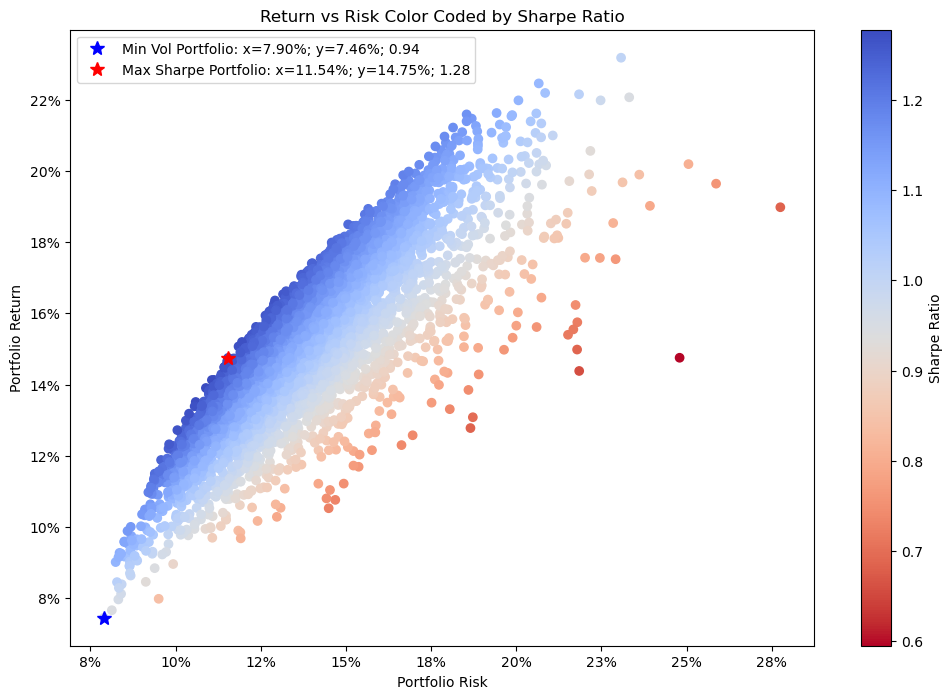

In [100]:
projectPortFolio=monteCarlo(projectPortFolio)
projectPortFolio

### Finding Commodities

In [101]:
dfGOLDEQ=runMovingAverageAndBB(dfGOLD,fastWindow,slowWindow, lookbackWindow, stdevBand).dropna()
dfSILVEREQ=runMovingAverageAndBB(dfSILVER,fastWindow,slowWindow, lookbackWindow, stdevBand).dropna()
corrPort=projectPortFolio['Portfolio'].to_frame().merge(dfGOLDEQ,how='inner',left_index=True, right_index=True)
corrPort=corrPort.merge(dfSILVEREQ,how='inner',left_index=True, right_index=True)
corrPort.corr()

,Portfolio,GOLD-BMK-MA,GOLD-MAFlat,GOLD-MAShort,GOLD-BMK-BB,GOLD-BB,SILVER-BMK-MA,SILVER-MAFlat,SILVER-MAShort,SILVER-BMK-BB,SILVER-BB
Portfolio,1.000000,0.017192,0.032483,0.035312,0.017192,-0.003912,0.077280,0.082297,0.049592,0.077280,-0.016997
GOLD-BMK-MA,0.017192,1.000000,0.808139,0.306437,1.000000,-0.255793,0.774724,0.563288,0.093682,0.774724,0.065594
GOLD-MAFlat,0.032483,0.808139,1.000000,0.808300,0.808139,-0.429640,0.639882,0.681909,0.411371,0.639882,-0.127251
GOLD-MAShort,0.035312,0.306437,0.808300,1.000000,0.306437,-0.438660,0.259702,0.538980,0.571184,0.259702,-0.271225
GOLD-BMK-BB,0.017192,1.000000,0.808139,0.306437,1.000000,-0.255793,0.774724,0.563288,0.093682,0.774724,0.065594
GOLD-BB,-0.003912,-0.255793,-0.429640,-0.438660,-0.255793,1.000000,-0.192666,-0.325097,-0.308504,-0.192666,0.332914
SILVER-BMK-MA,0.077280,0.774724,0.639882,0.259702,0.774724,-0.192666,1.000000,0.770784,0.188292,1.000000,0.057693
SILVER-MAFlat,0.082297,0.563288,0.681909,0.538980,0.563288,-0.325097,0.770784,1.000000,0.770833,0.770784,-0.259294
SILVER-MAShort,0.049592,0.093682,0.411371,0.571184,0.093682,-0.308504,0.188292,0.770833,1.000000,0.188292,-0.457402
SILVER-BMK-BB,0.077280,0.774724,0.639882,0.259702,0.774724,-0.192666,1.000000,0.770784,0.188292,1.000000,0.057693


In [102]:
commPortfolio=projectPortFolio.drop(columns='Portfolio').merge(dfSILVEREQ['SILVER-MAShort'],how='inner',left_index=True, right_index=True)
commPortfolio

,SPY-MAFlat,AAPL-MAFlat,AMZN-MAFlat,GE-MAShort,ATT-BB,SILVER-MAShort
2000-12-06,-0.0,-0.0,-0.0,0.003470,0.000000,-0.008439
2000-12-07,-0.0,0.0,-0.0,0.008144,0.000000,0.004211
2000-12-08,0.0,0.0,0.0,-0.031055,-0.000000,0.017022
2000-12-11,0.0,0.0,0.0,-0.002262,-0.000000,-0.002144
2000-12-12,-0.0,0.0,0.0,0.046251,0.000000,-0.002139
...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.0,0.032697,-0.034133,-0.008298
2018-12-26,0.0,0.0,0.0,-0.065712,0.025975,-0.017478
2018-12-27,0.0,-0.0,-0.0,0.016371,0.002490,-0.012689
2018-12-28,-0.0,0.0,0.0,-0.032479,0.010952,-0.010219


               Min Volatility Portfolio Weights Max Sharpe Portfolio Weights
SPY-MAFlat                               36.76%                        6.37%
AAPL-MAFlat                               3.31%                       30.37%
AMZN-MAFlat                               3.88%                       10.75%
GE-MAShort                                8.93%                       19.12%
ATT-BB                                   39.60%                       31.54%
SILVER-MAShort                            7.53%                        1.85%


,SPY-MAFlat,AAPL-MAFlat,AMZN-MAFlat,GE-MAShort,ATT-BB,SILVER-MAShort,Portfolio
2000-12-06,-0.0,-0.0,-0.0,0.003470,0.000000,-0.008439,-0.000828
2000-12-07,-0.0,0.0,-0.0,0.008144,0.000000,0.004211,0.002059
2000-12-08,0.0,0.0,0.0,-0.031055,-0.000000,0.017022,-0.002339
2000-12-11,0.0,0.0,0.0,-0.002262,-0.000000,-0.002144,-0.000734
2000-12-12,-0.0,0.0,0.0,0.046251,0.000000,-0.002139,0.007352
...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.0,0.032697,-0.034133,-0.008298,-0.001622
2018-12-26,0.0,0.0,0.0,-0.065712,0.025975,-0.017478,-0.009536
2018-12-27,0.0,-0.0,-0.0,0.016371,0.002490,-0.012689,0.001029
2018-12-28,-0.0,0.0,0.0,-0.032479,0.010952,-0.010219,-0.005291


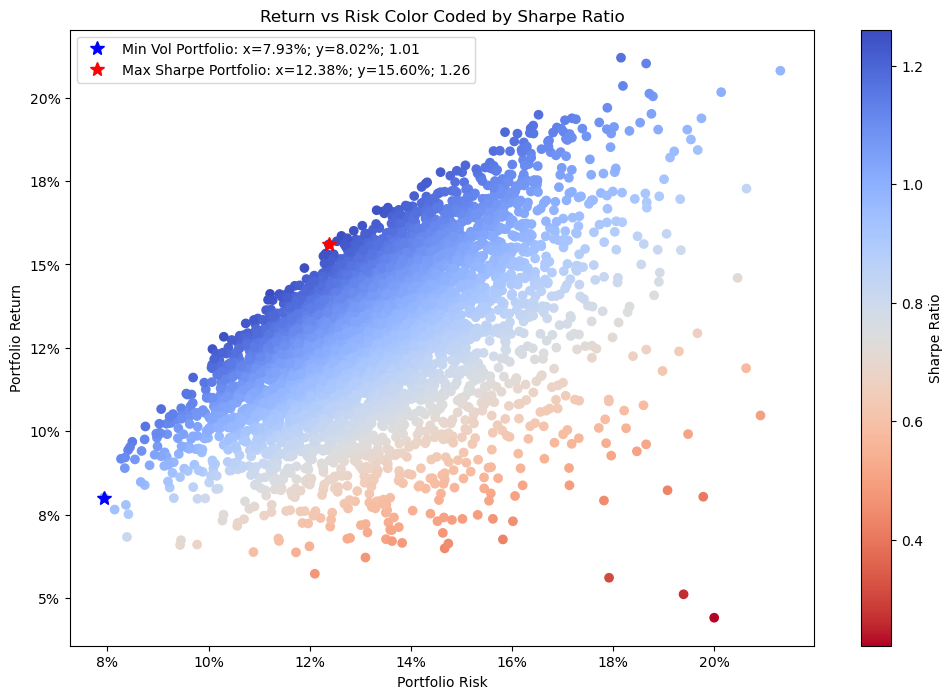

In [103]:
commPortfolio=monteCarlo(commPortfolio)
commPortfolio

### Finding Currencies

In [104]:
dfEUREQ=runMovingAverageAndBB(dfEUR,fastWindow,slowWindow, lookbackWindow, stdevBand).dropna()
dfAUDREQ=runMovingAverageAndBB(dfAUD,fastWindow,slowWindow, lookbackWindow, stdevBand).dropna()
corrPort=commPortfolio['Portfolio'].to_frame().merge(dfEUREQ,how='inner',left_index=True, right_index=True)
corrPort=corrPort.merge(dfAUDREQ,how='inner',left_index=True, right_index=True)
corrPort.corr()

,Portfolio,EUR-BMK-MA,EUR-MAFlat,EUR-MAShort,EUR-BMK-BB,EUR-BB,AUD-BMK-MA,AUD-MAFlat,AUD-MAShort,AUD-BMK-BB,AUD-BB
Portfolio,1.000000,0.063608,0.143317,0.139221,0.063608,-0.031693,0.158947,0.279641,0.203680,0.158947,-0.021797
EUR-BMK-MA,0.063608,1.000000,0.707640,0.001425,1.000000,0.089195,0.564509,0.407477,-0.036103,0.564509,0.204606
EUR-MAFlat,0.143317,0.707640,1.000000,0.707581,0.707640,-0.202241,0.380539,0.470082,0.229047,0.380539,0.006587
EUR-MAShort,0.139221,0.001425,0.707581,1.000000,0.001425,-0.375430,-0.025987,0.257787,0.360271,-0.025987,-0.195301
EUR-BMK-BB,0.063608,1.000000,0.707640,0.001425,1.000000,0.089195,0.564509,0.407477,-0.036103,0.564509,0.204606
EUR-BB,-0.031693,0.089195,-0.202241,-0.375430,0.089195,1.000000,0.179542,-0.076162,-0.278301,0.179542,0.353861
AUD-BMK-MA,0.158947,0.564509,0.380539,-0.025987,0.564509,0.179542,1.000000,0.648371,-0.159206,1.000000,0.482155
AUD-MAFlat,0.279641,0.407477,0.470082,0.257787,0.407477,-0.076162,0.648371,1.000000,0.648390,0.648371,-0.004128
AUD-MAShort,0.203680,-0.036103,0.229047,0.360271,-0.036103,-0.278301,-0.159206,0.648390,1.000000,-0.159206,-0.487497
AUD-BMK-BB,0.158947,0.564509,0.380539,-0.025987,0.564509,0.179542,1.000000,0.648371,-0.159206,1.000000,0.482155


In [105]:
currPortfolio=commPortfolio.drop(columns='Portfolio').merge(dfEUREQ['EUR-BB'],how='inner',left_index=True, right_index=True)
currPortfolio

,SPY-MAFlat,AAPL-MAFlat,AMZN-MAFlat,GE-MAShort,ATT-BB,SILVER-MAShort,EUR-BB
2000-12-06,-0.0,-0.0,-0.0,0.003470,0.000000,-0.008439,0.0
2000-12-07,-0.0,0.0,-0.0,0.008144,0.000000,0.004211,-0.0
2000-12-08,0.0,0.0,0.0,-0.031055,-0.000000,0.017022,0.0
2000-12-11,0.0,0.0,0.0,-0.002262,-0.000000,-0.002144,-0.0
2000-12-12,-0.0,0.0,0.0,0.046251,0.000000,-0.002139,0.0
...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.0,0.032697,-0.034133,-0.008298,0.0
2018-12-26,0.0,0.0,0.0,-0.065712,0.025975,-0.017478,-0.0
2018-12-27,0.0,-0.0,-0.0,0.016371,0.002490,-0.012689,0.0
2018-12-28,-0.0,0.0,0.0,-0.032479,0.010952,-0.010219,0.0


               Min Volatility Portfolio Weights Max Sharpe Portfolio Weights
SPY-MAFlat                                9.65%                       12.74%
AAPL-MAFlat                               3.90%                       23.07%
AMZN-MAFlat                               2.33%                       12.19%
GE-MAShort                                5.15%                       19.45%
ATT-BB                                   31.01%                       25.55%
SILVER-MAShort                            9.26%                        0.54%
EUR-BB                                   38.69%                        6.45%


,SPY-MAFlat,AAPL-MAFlat,AMZN-MAFlat,GE-MAShort,ATT-BB,SILVER-MAShort,EUR-BB,Portfolio
2000-12-06,-0.0,-0.0,-0.0,0.003470,0.000000,-0.008439,0.0,-0.000710
2000-12-07,-0.0,0.0,-0.0,0.008144,0.000000,0.004211,-0.0,0.001765
2000-12-08,0.0,0.0,0.0,-0.031055,-0.000000,0.017022,0.0,-0.002005
2000-12-11,0.0,0.0,0.0,-0.002262,-0.000000,-0.002144,-0.0,-0.000629
2000-12-12,-0.0,0.0,0.0,0.046251,0.000000,-0.002139,0.0,0.006302
...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.0,0.032697,-0.034133,-0.008298,0.0,-0.001391
2018-12-26,0.0,0.0,0.0,-0.065712,0.025975,-0.017478,-0.0,-0.008173
2018-12-27,0.0,-0.0,-0.0,0.016371,0.002490,-0.012689,0.0,0.000882
2018-12-28,-0.0,0.0,0.0,-0.032479,0.010952,-0.010219,0.0,-0.004535


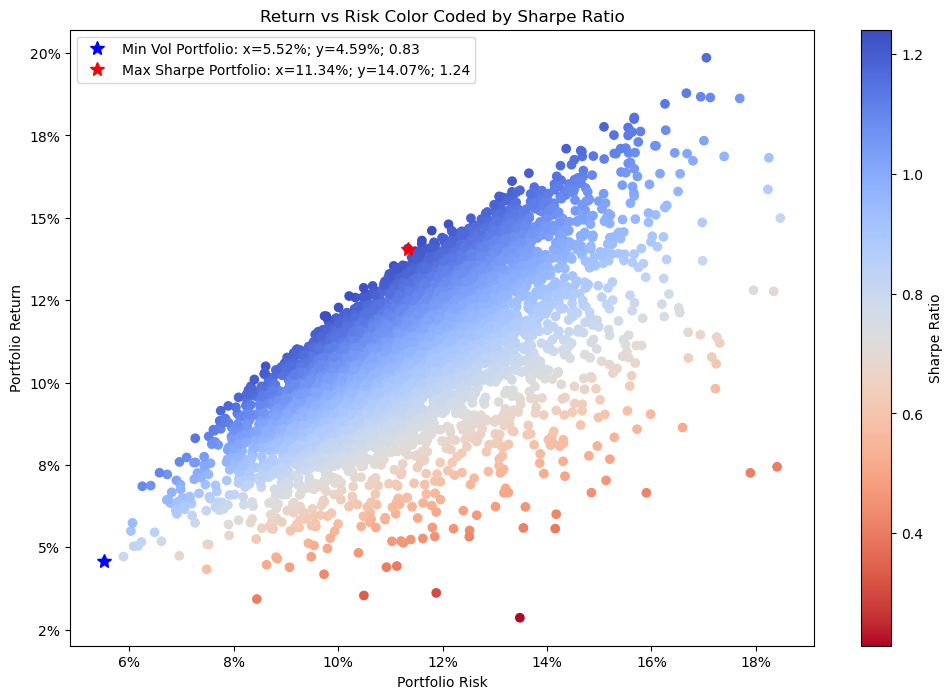

In [106]:
currPortfolio=monteCarlo(currPortfolio)
currPortfolio

### Finding Bonds

In [107]:
dfLEHMEQ=runMovingAverageAndBB(dfLEHM,fastWindow,slowWindow, lookbackWindow, stdevBand).dropna()
dfFBNDXEQ=runMovingAverageAndBB(dfFBNDX,fastWindow,slowWindow, lookbackWindow, stdevBand).dropna()
corrPort=currPortfolio['Portfolio'].to_frame().merge(dfLEHMEQ,how='inner',left_index=True, right_index=True)
corrPort=corrPort.merge(dfFBNDXEQ,how='inner',left_index=True, right_index=True)
corrPort.corr()

,Portfolio,LEHM-BMK-MA,LEHM-MAFlat,LEHM-MAShort,LEHM-BMK-BB,LEHM-BB,FBNDX-BMK-MA,FBNDX-MAFlat,FBNDX-MAShort,FBNDX-BMK-BB,FBNDX-BB
Portfolio,1.000000,-0.102820,-0.071459,-0.010112,-0.102820,0.027529,-0.086747,-0.076326,-0.019819,-0.086747,-0.011770
LEHM-BMK-MA,-0.102820,1.000000,0.790128,0.248685,1.000000,-0.021107,0.912725,0.645995,-0.010831,0.912725,0.129175
LEHM-MAFlat,-0.071459,0.790128,1.000000,0.790179,0.790128,-0.217784,0.726727,0.732443,0.295923,0.726727,-0.143551
LEHM-MAShort,-0.010112,0.248685,0.790179,1.000000,0.248685,-0.323043,0.235763,0.511497,0.478454,0.235763,-0.356004
LEHM-BMK-BB,-0.102820,1.000000,0.790128,0.248685,1.000000,-0.021107,0.912725,0.645995,-0.010831,0.912725,0.129175
LEHM-BB,0.027529,-0.021107,-0.217784,-0.323043,-0.021107,1.000000,-0.032887,-0.177841,-0.215448,-0.032887,0.516843
FBNDX-BMK-MA,-0.086747,0.912725,0.726727,0.235763,0.912725,-0.032887,1.000000,0.698215,-0.025203,1.000000,0.170711
FBNDX-MAFlat,-0.076326,0.645995,0.732443,0.511497,0.645995,-0.177841,0.698215,1.000000,0.698064,0.698215,-0.180924
FBNDX-MAShort,-0.019819,-0.010831,0.295923,0.478454,-0.010831,-0.215448,-0.025203,0.698064,1.000000,-0.025203,-0.423393
FBNDX-BMK-BB,-0.086747,0.912725,0.726727,0.235763,0.912725,-0.032887,1.000000,0.698215,-0.025203,1.000000,0.170711


In [109]:
bondPortfolio=currPortfolio.drop(columns='Portfolio').merge(dfLEHMEQ['LEHM-BMK-MA'],how='inner',left_index=True, right_index=True)
bondPortfolio

,SPY-MAFlat,AAPL-MAFlat,AMZN-MAFlat,GE-MAShort,ATT-BB,SILVER-MAShort,EUR-BB,LEHM-BMK-MA
2000-12-06,-0.0,-0.0,-0.0,0.003470,0.000000,-0.008439,0.0,0.004519
2000-12-07,-0.0,0.0,-0.0,0.008144,0.000000,0.004211,-0.0,0.000619
2000-12-08,0.0,0.0,0.0,-0.031055,-0.000000,0.017022,0.0,-0.001282
2000-12-11,0.0,0.0,0.0,-0.002262,-0.000000,-0.002144,-0.0,-0.000261
2000-12-12,-0.0,0.0,0.0,0.046251,0.000000,-0.002139,0.0,0.000467
...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.0,0.032697,-0.034133,-0.008298,0.0,0.001688
2018-12-26,0.0,0.0,0.0,-0.065712,0.025975,-0.017478,-0.0,-0.002511
2018-12-27,0.0,-0.0,-0.0,0.016371,0.002490,-0.012689,0.0,0.002101
2018-12-28,-0.0,0.0,0.0,-0.032479,0.010952,-0.010219,0.0,0.000285


               Min Volatility Portfolio Weights Max Sharpe Portfolio Weights
SPY-MAFlat                                8.45%                        8.43%
AAPL-MAFlat                               3.86%                       16.43%
AMZN-MAFlat                               4.57%                        3.30%
GE-MAShort                                2.10%                        9.19%
ATT-BB                                   12.95%                       22.27%
SILVER-MAShort                            8.03%                        1.13%
EUR-BB                                   27.66%                        6.32%
LEHM-BMK-MA                              32.38%                       32.94%


,SPY-MAFlat,AAPL-MAFlat,AMZN-MAFlat,GE-MAShort,ATT-BB,SILVER-MAShort,EUR-BB,LEHM-BMK-MA,Portfolio
2000-12-06,-0.0,-0.0,-0.0,0.003470,0.000000,-0.008439,0.0,0.004519,-0.000056
2000-12-07,-0.0,0.0,-0.0,0.008144,0.000000,0.004211,-0.0,0.000619,0.001622
2000-12-08,0.0,0.0,0.0,-0.031055,-0.000000,0.017022,0.0,-0.001282,-0.001914
2000-12-11,0.0,0.0,0.0,-0.002262,-0.000000,-0.002144,-0.0,-0.000261,-0.000583
2000-12-12,-0.0,0.0,0.0,0.046251,0.000000,-0.002139,0.0,0.000467,0.005572
...,...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.0,0.032697,-0.034133,-0.008298,0.0,0.001688,-0.001006
2018-12-26,0.0,0.0,0.0,-0.065712,0.025975,-0.017478,-0.0,-0.002511,-0.007466
2018-12-27,0.0,-0.0,-0.0,0.016371,0.002490,-0.012689,0.0,0.002101,0.001034
2018-12-28,-0.0,0.0,0.0,-0.032479,0.010952,-0.010219,0.0,0.000285,-0.003933


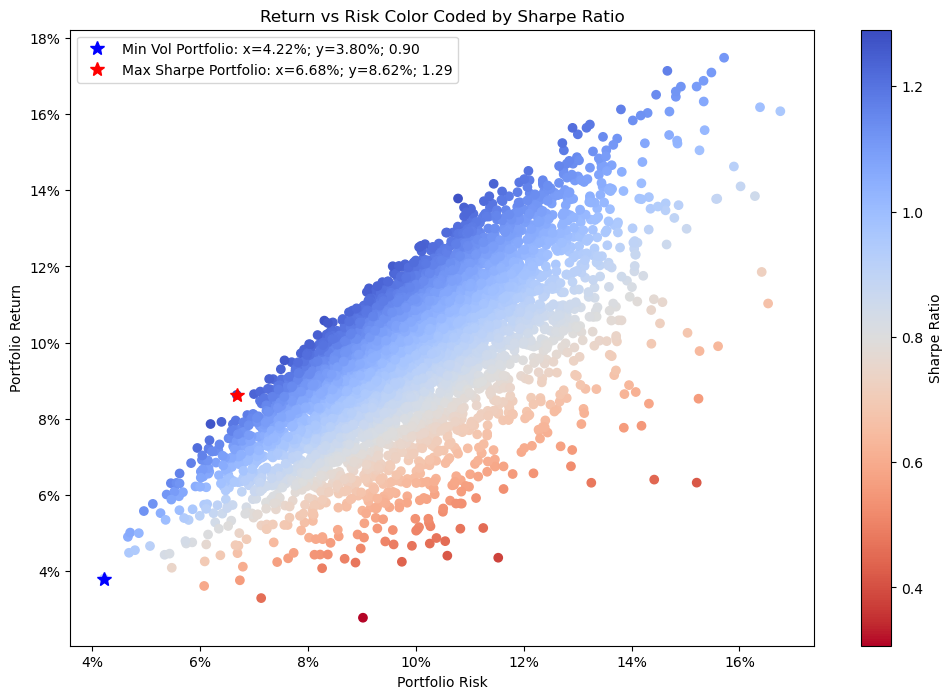

In [110]:
bondPortfolio=monteCarlo(bondPortfolio)
bondPortfolio

### Rationale towards minimum volatility
Bonds and the currencies are highly stable with positive returns which makes sense why they would dominate a minimum volatility portfolio


### Rationale for maximum returns
In the stocks the AAPL and AMZN are being used to highly increase the returns as they are high performing stocks with a lot of volatility. The ATT is used to reduce that volatility as it is not as correlated with the others. The actual diversification comes from the bonds as that is negatively correlated with our portfolio increasing our overall Shapre ratio.

### Calculating performance statistics (Sharpe Ratios)

In [36]:
calcPerformanceStatistics(dfAAPLMA,print_Screen=False)['Sharpe Ratio'][['AAPL-MAFlat','AAPL-MAShort']]
# print_pct_data(dfAAPLMA)

AAPL-MAFlat     0.840178
AAPL-MAShort    0.533365
Name: Sharpe Ratio, dtype: float64

In [37]:
def BBStrategy(df_temp):
    column_name = df_temp.columns[0]
    
    dfSharpes = BB_Window_Generator(df_temp)
    # Scatter-plot for the BB strategy

    # Clean the data: Drop NaN values
    dfSharpes_cleaned_BB = dfSharpes[f'{column_name}-BB'].dropna()

    # Ensure the column is numeric
    dfSharpes_cleaned_BB = pd.to_numeric(dfSharpes_cleaned_BB, errors='coerce')

    # Find the max Sharpe ratio point for the "go flat" strategy
    max_sharpe_BB = dfSharpes_cleaned_BB.idxmax()
    max_sharpe_value_BB = dfSharpes_cleaned_BB.max()

    # Extract the fast and slow window corresponding to the max Sharpe ratio
    lookback_window, std_dev = max_sharpe_BB

    # Create a new figure for the "go flat" strategy scatter plot
    plt.figure(figsize=aspect_ratio)

    # Create a subplot for plotting.
    ax = plt.subplot()

    # Scatter plot for "go flat" strategy color-coded by Sharpe ratio
    sc = plt.scatter(dfSharpes.reset_index()['lookbackWindow'], dfSharpes.reset_index()['stdevBand'], 
                     c=dfSharpes.reset_index()[f'{column_name}-BB'], marker='.', cmap='coolwarm_r')

    # Add a colorbar for the Sharpe ratio
    plt.colorbar(sc, label='Sharpe Ratio')

    # Plot the maximum Sharpe point with a red star
    plt.scatter(lookback_window, std_dev, color='red', marker='*', s=200)

    # Set the x and y axis ticks
    ax.set_xticks(range(20,100,1))
    ax.set_yticks(range(1,4, 1))

    # Set the title and labels
    plt.title('Sharpe Ratio for Different BB')
    plt.xlabel('Lookback Windows')
    plt.ylabel('Standard deviations')

    # Add a legend showing the fast window, slow window, and max Sharpe ratio
    plt.legend([f'Max Sharpe (Lookback={lookback_window}, Std dev={std_dev}, Sharpe={max_sharpe_value_BB:.4f})'], 
               loc='upper right')

    # Show the plot
    plt.show()
    return dfSharpes_cleaned_BB

In [38]:
def FlatThenShortStrategy(df_temp):
    column_name=df_temp.columns[0]
    
    dfSharpes = MA_Window_Generator(df_temp)

    # Scatter-plot for the go-flat strategy

    # Clean the data: Drop NaN values
    dfSharpes_cleaned_flat = dfSharpes[f'{column_name}-MAFlat'].dropna()

    # Ensure the column is numeric
    dfSharpes_cleaned_flat = pd.to_numeric(dfSharpes_cleaned_flat, errors='coerce')

    # Find the max Sharpe ratio point for the "go flat" strategy
    max_sharpe_flat = dfSharpes_cleaned_flat.idxmax()
    max_sharpe_value_flat = dfSharpes_cleaned_flat.max()

    # Extract the fast and slow window corresponding to the max Sharpe ratio
    fast_window_flat, slow_window_flat = max_sharpe_flat

    # Create a new figure for the "go flat" strategy scatter plot
    plt.figure(figsize=aspect_ratio)

    # Create a subplot for plotting.
    ax = plt.subplot()

    # Scatter plot for "go flat" strategy color-coded by Sharpe ratio
    sc = plt.scatter(dfSharpes.reset_index()['fast_window'], dfSharpes.reset_index()['slow_window'], 
                     c=dfSharpes.reset_index()[f'{column_name}-MAFlat'], marker='.', cmap='coolwarm_r')

    # Add a colorbar for the Sharpe ratio
    plt.colorbar(sc, label='Sharpe Ratio')

    # Plot the maximum Sharpe point with a red star
    plt.scatter(fast_window_flat, slow_window_flat, color='red', marker='*', s=200)

    # Set the x and y axis ticks
    ax.set_xticks(range(5, 115, 10))
    ax.set_yticks(range(50, 550, 50))

    # Set the title and labels
    plt.title('Sharpe Ratio for Different Fast and Slow Windows (Go Flat Strategy)')
    plt.xlabel('Fast Windows')
    plt.ylabel('Slow Windows')

    # Add a legend showing the fast window, slow window, and max Sharpe ratio
    plt.legend([f'Max Sharpe (Fast={fast_window_flat}, Slow={slow_window_flat}, Sharpe={max_sharpe_value_flat:.4f})'], 
               loc='upper right')

    # Show the plot
    plt.show()
    
    # Go Short Strategy Starts
    # Clean the data: Drop NaN values
    dfSharpes_cleaned = dfSharpes[f'{column_name}-MAShort'].dropna()

    # Ensure the column is numeric
    dfSharpes_cleaned = pd.to_numeric(dfSharpes_cleaned, errors='coerce')

    # Find the max Sharpe ratio point for the "go short" strategy
    max_sharpe_short = dfSharpes_cleaned.idxmax()
    max_sharpe_value_short = dfSharpes_cleaned.max()

    # Extract the fast and slow window corresponding to the max Sharpe ratio
    fast_window_short, slow_window_short = max_sharpe_short

    # Create a new figure for the "go short" strategy scatter plot
    plt.figure(figsize=aspect_ratio)

    # Create a subplot for plotting.
    ax = plt.subplot()

    # Scatter plot for "go short" strategy color-coded by Sharpe ratio
    sc = plt.scatter(dfSharpes.reset_index()['fast_window'], dfSharpes.reset_index()['slow_window'], 
                     c=dfSharpes.reset_index()[f'{column_name}-MAShort'], marker='.', cmap='coolwarm_r')

    # Add a colorbar for the Sharpe ratio
    plt.colorbar(sc, label='Sharpe Ratio')

    # Plot the maximum Sharpe point with a red star
    plt.scatter(fast_window_short, slow_window_short, color='red', marker='*', s=200)

    # Set the x and y axis ticks
    ax.set_xticks(range(5, 115, 10))
    ax.set_yticks(range(50, 550, 50))

    # Set the title and labels
    plt.title('Sharpe Ratio for Different Fast and Slow Windows (Go Short Strategy)')
    plt.xlabel('Fast Windows')
    plt.ylabel('Slow Windows')

    # Add a legend showing the fast window, slow window, and max Sharpe ratio
    plt.legend([f'Max Sharpe (Fast={fast_window_short}, Slow={slow_window_short}, Sharpe={max_sharpe_value_short:.4f})'], 
               loc='upper right')

    # Show the plot
    plt.show()
    return (dfSharpes_cleaned_flat,dfSharpes_cleaned)

                 AAPL
1999-12-31   0.917969
2000-01-03   0.999442
2000-01-04   0.915179
2000-01-05   0.928571
2000-01-06   0.848214
...               ...
2018-12-24  36.707500
2018-12-26  39.292500
2018-12-27  39.037498
2018-12-28  39.057499
2018-12-31  39.435001

[4745 rows x 1 columns]


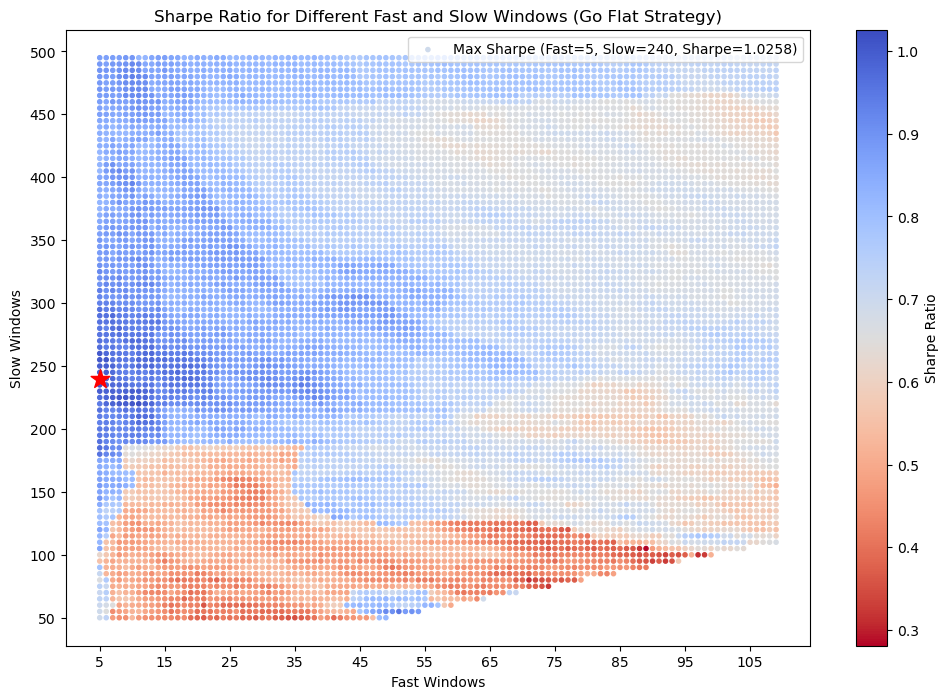

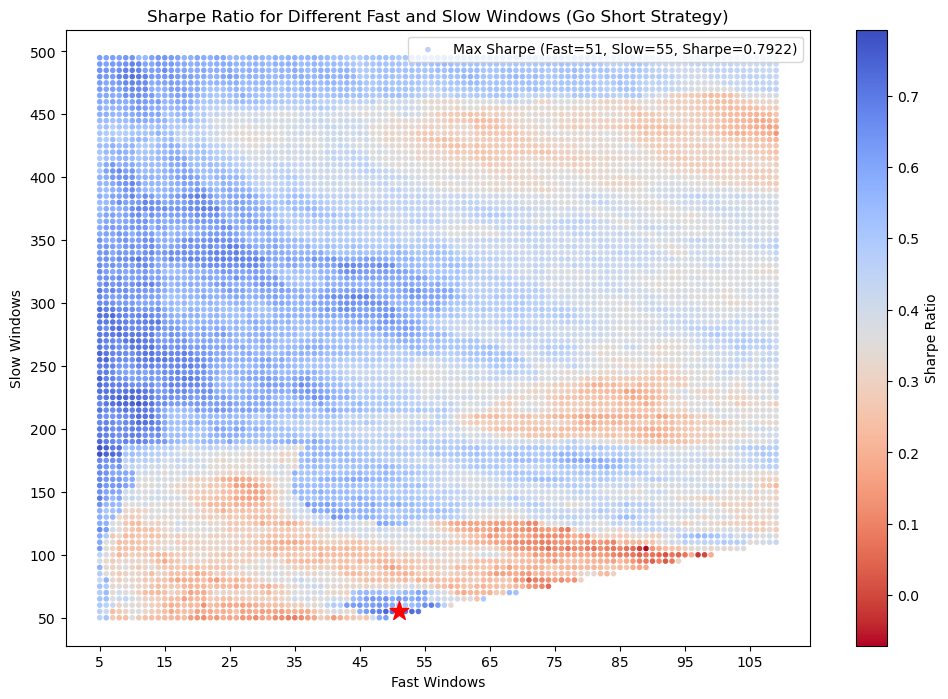

In [39]:
dfAAPLFlat,dfAAPLShort=FlatThenShortStrategy(dfAAPL)

                 AMZN
1999-12-31   3.806250
2000-01-03   4.468750
2000-01-04   4.096875
2000-01-05   3.487500
2000-01-06   3.278125
...               ...
2018-12-24  67.197998
2018-12-26  73.544998
2018-12-27  73.082001
2018-12-28  73.901001
2018-12-31  75.098503

[4745 rows x 1 columns]


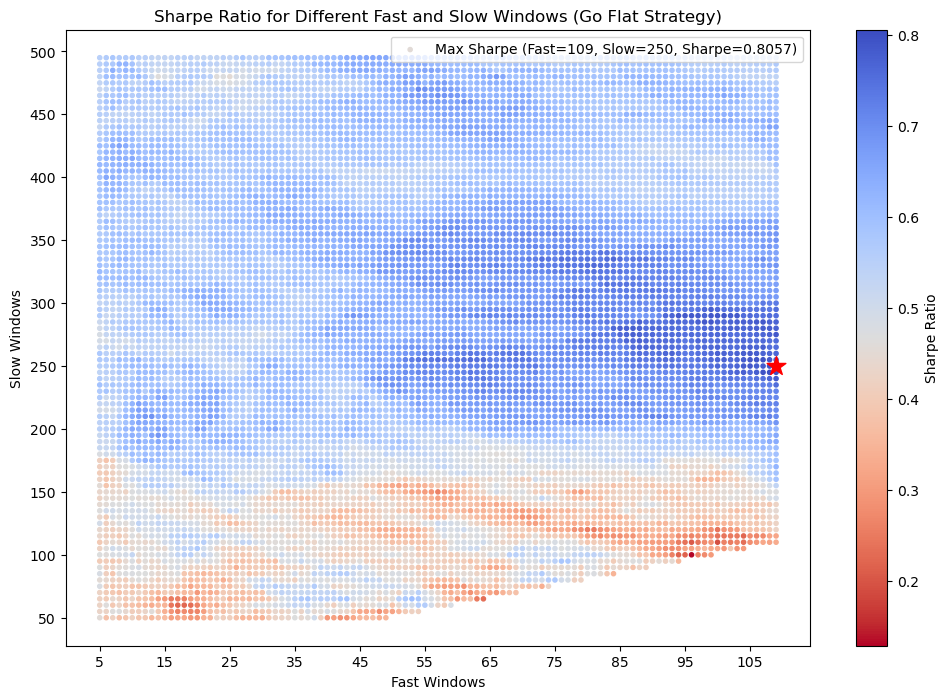

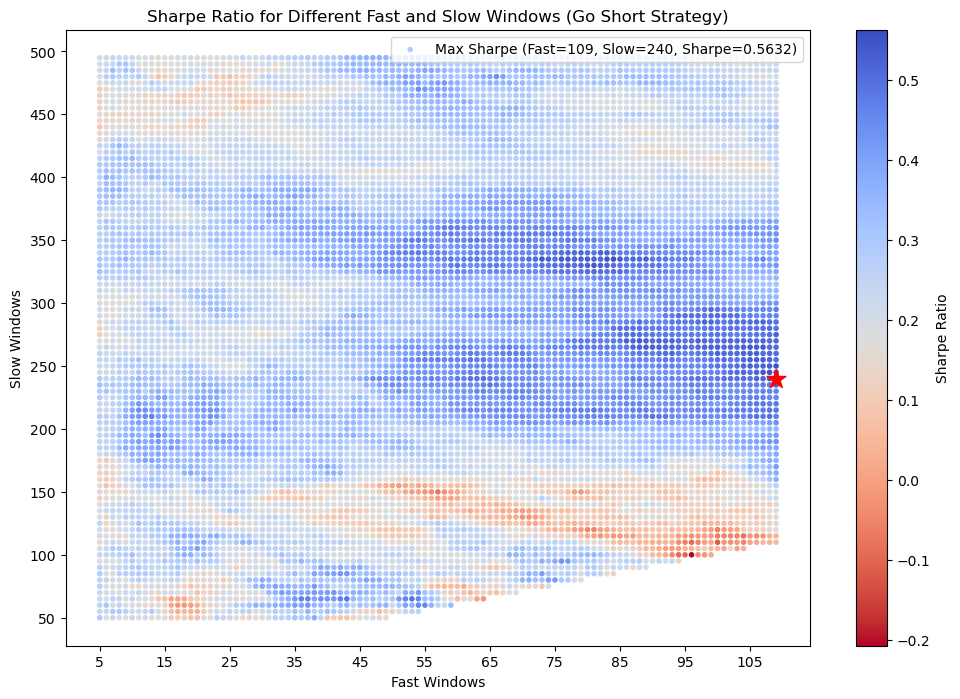

In [40]:
dfAMZNFlat,dfAMZNShort=FlatThenShortStrategy(dfAMZN)

                  ATT
1999-12-31  36.820244
2000-01-03  35.498489
2000-01-04  33.421452
2000-01-05  33.940708
2000-01-06  33.043808
...               ...
2018-12-24  20.664654
2018-12-26  21.208460
2018-12-27  21.261330
2018-12-28  21.495468
2018-12-31  21.555891

[4745 rows x 1 columns]


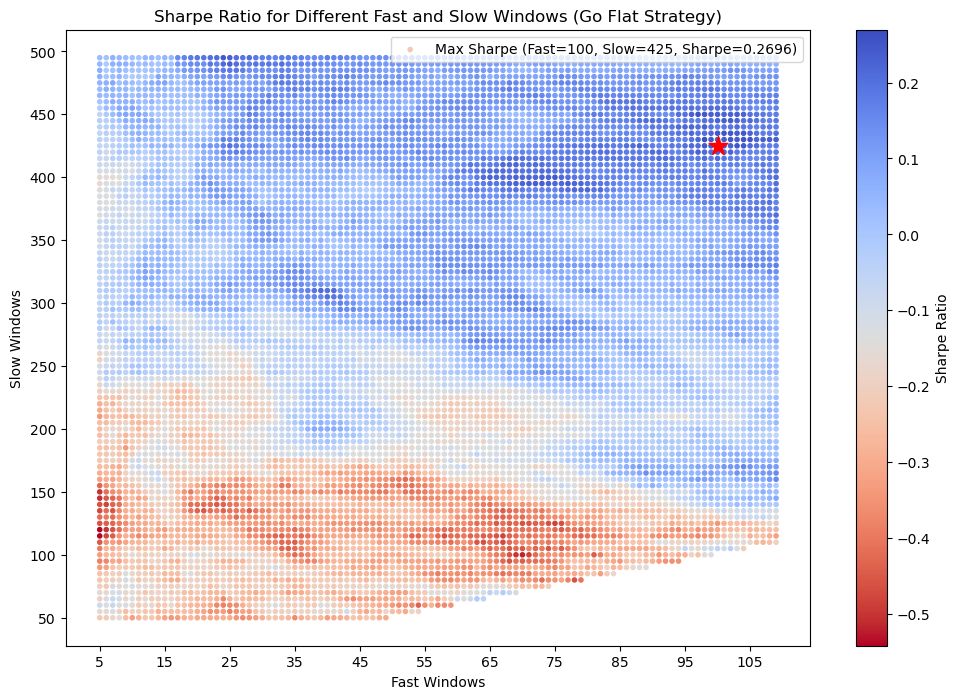

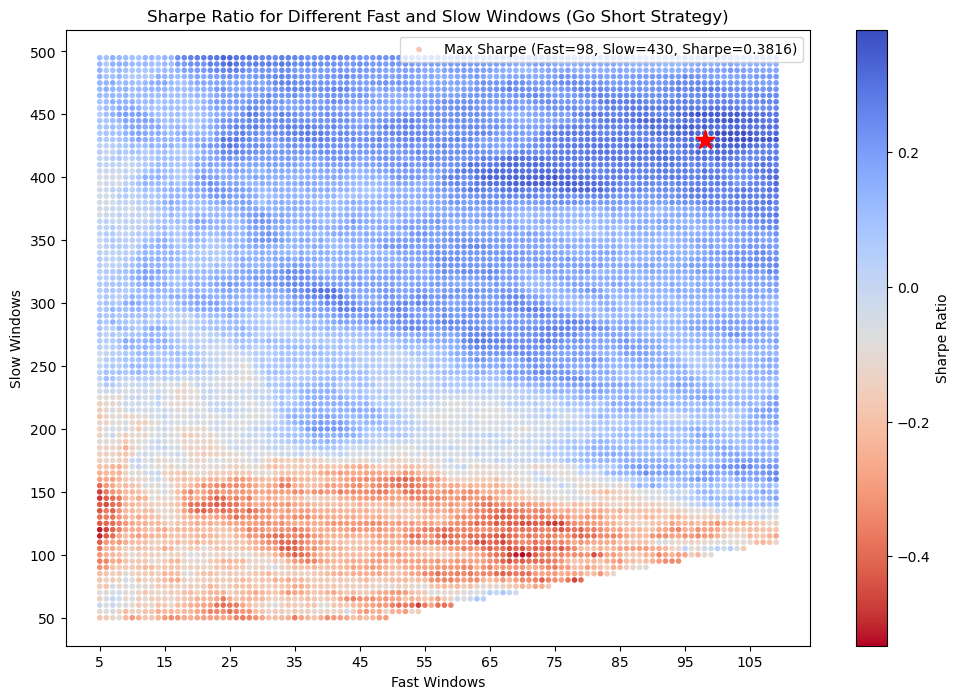

In [41]:
dfATTFlat,dfATTShort=FlatThenShortStrategy(dfATT)

                    GE
1999-12-31  396.794861
2000-01-03  384.615387
2000-01-04  369.230774
2000-01-05  368.589752
2000-01-06  373.517639
...                ...
2018-12-24   53.230770
2018-12-26   56.846153
2018-12-27   55.923077
2018-12-28   57.769230
2018-12-31   58.230770

[4745 rows x 1 columns]


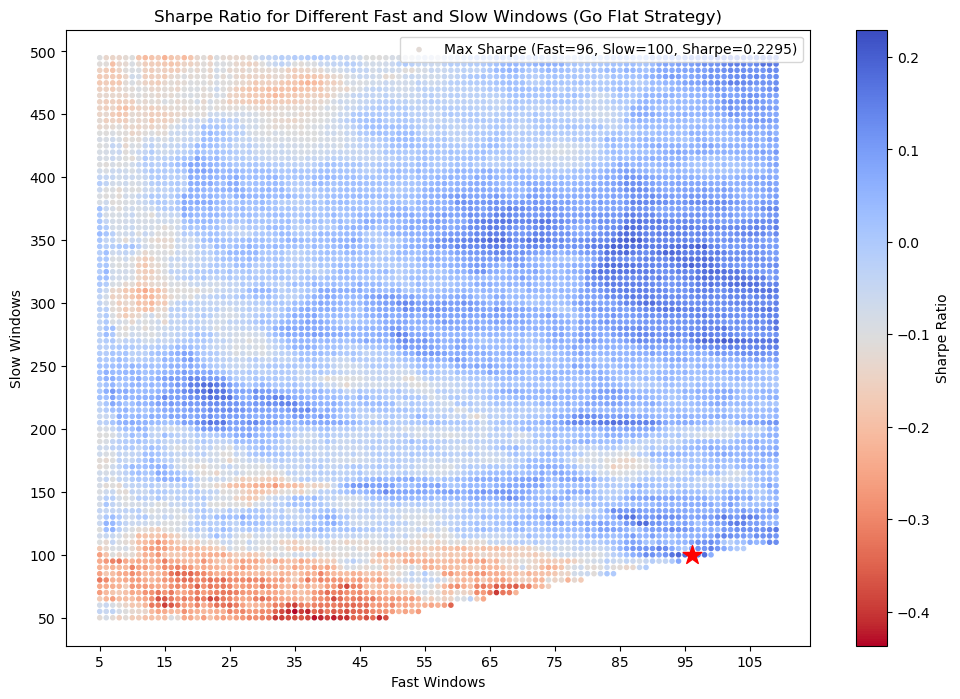

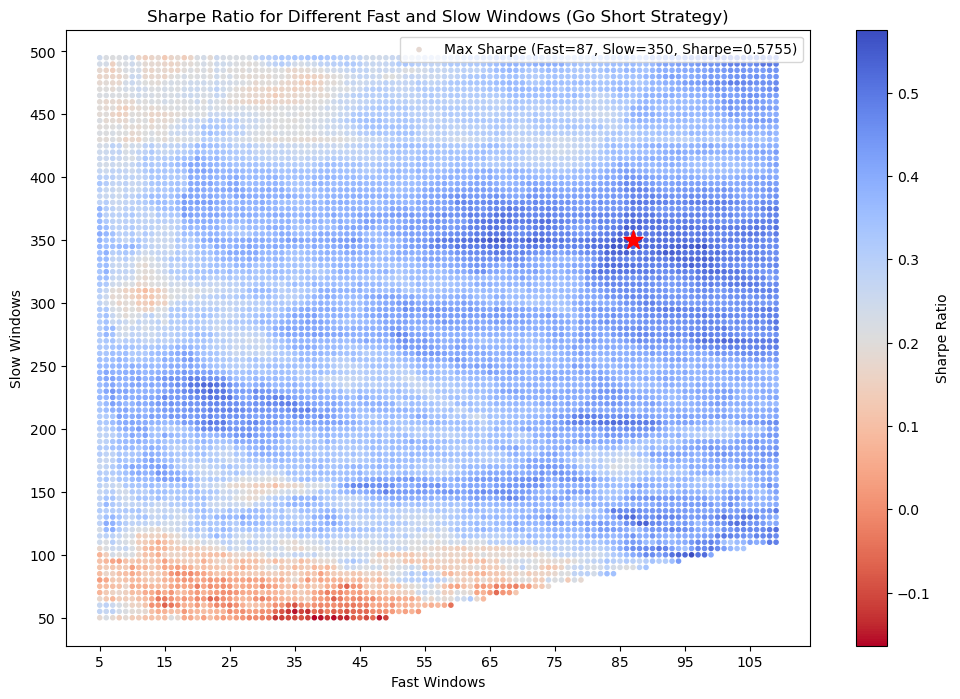

In [42]:
dfGEFlat,dfGEShort=FlatThenShortStrategy(dfGE)

                 INTC
1999-12-31  41.156250
2000-01-03  43.500000
2000-01-04  41.468750
2000-01-05  41.812500
2000-01-06  39.375000
...               ...
2018-12-24  43.590000
2018-12-26  46.189999
2018-12-27  46.360001
2018-12-28  46.750000
2018-12-31  46.930000

[4745 rows x 1 columns]


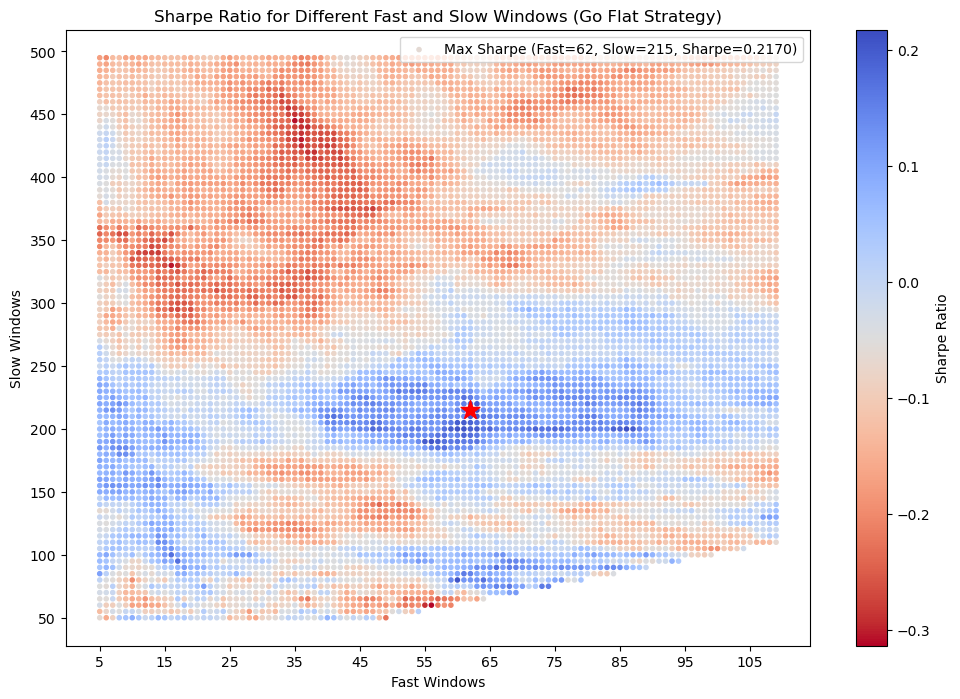

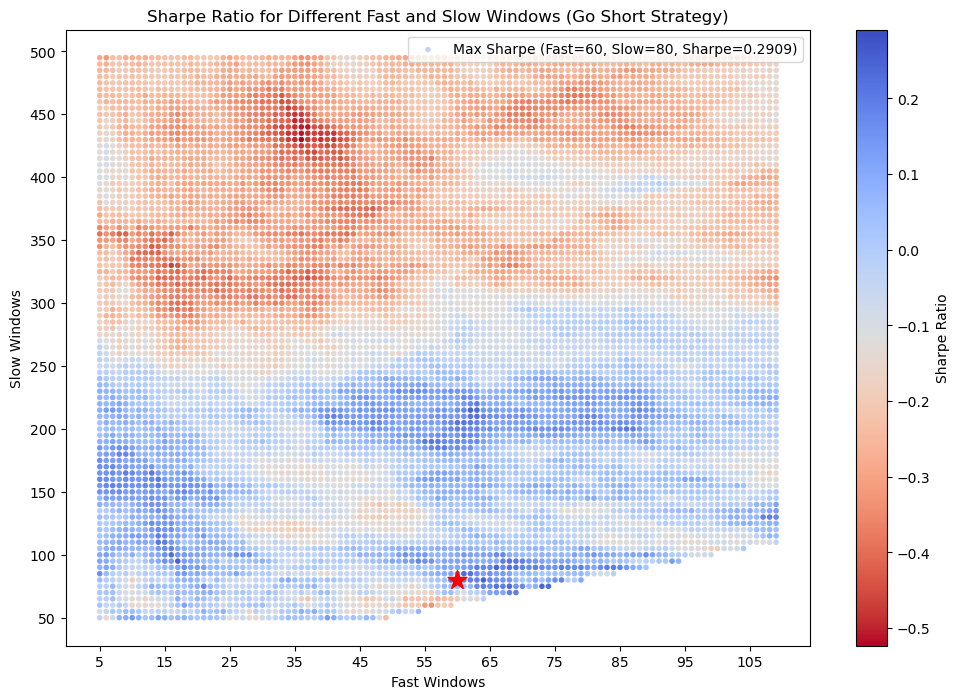

In [43]:
dfINTCFlat,dfINTCShort=FlatThenShortStrategy(dfINTC)

                   SPY
1999-12-31  146.875000
2000-01-03  145.437500
2000-01-04  139.750000
2000-01-05  140.000000
2000-01-06  137.750000
...                ...
2018-12-24  234.339996
2018-12-26  246.179993
2018-12-27  248.070007
2018-12-28  247.750000
2018-12-31  249.919998

[4745 rows x 1 columns]


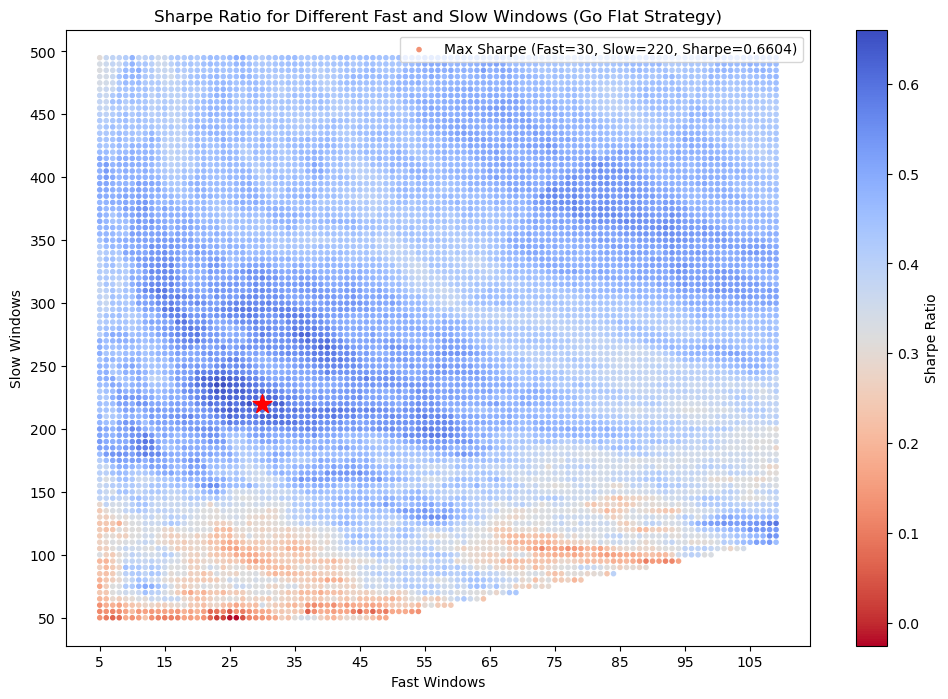

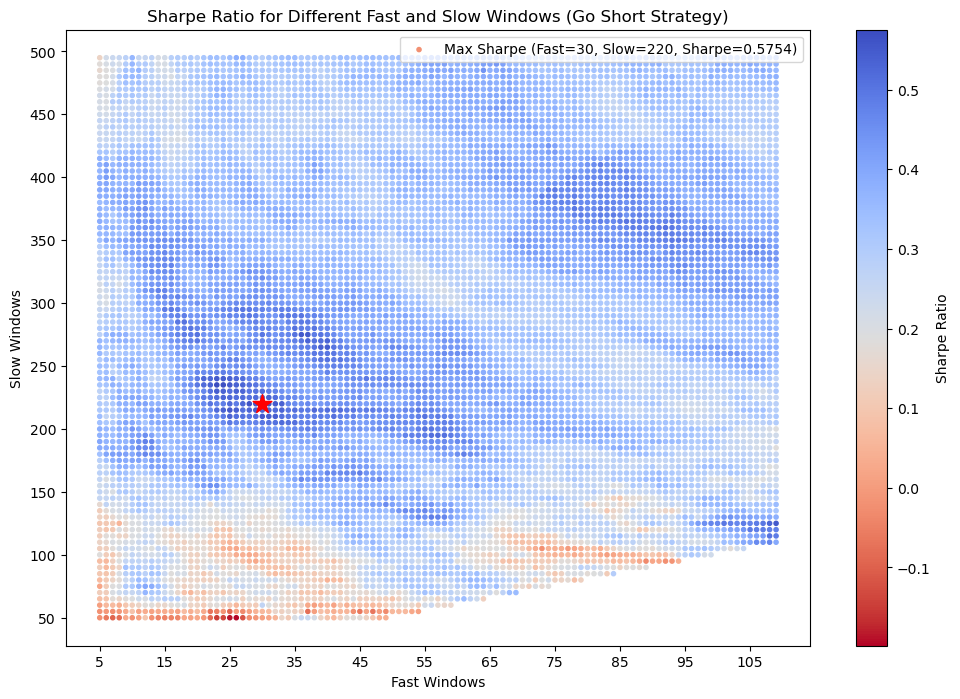

In [44]:
dfSPYFlat,dfSPYShort=FlatThenShortStrategy(dfSPY)

## Finding Combinations

### Finding best MA combinations

In [45]:
def merge_combination(combo):
    combo = [df.to_frame() if isinstance(df, pd.Series) else df for df in combo]
    # Merge the first table with the rest in the combination
    merged_table = combo[0]
    for table in combo[1:]:
        merged_table = pd.merge(merged_table, table, left_index=True, right_index=True)  # Merge on 'ID'
    return merged_table
def min_max_normalize(df):
    # Identify columns to normalize (exclude 'ID' column)
    columns_to_normalize = df.columns
    
    # Initialize MinMaxScaler
    scaler = MinMaxScaler()
    
    # Apply MinMaxScaler to the numeric columns
    df[columns_to_normalize] = scaler.fit_transform(df[columns_to_normalize])
    
    return df
def add_sum_column(df):
    # Get all column names excluding 'ID'
    columns_to_sum = df.columns
    
    # Concatenate all column names
    new_column_name = '_'.join(columns_to_sum)
    
    # Add a new column with the sum of all columns
    sum_values = df[columns_to_sum].sum(axis=1)
    # Count the number of columns being summed
    num_columns = len(columns_to_sum)
    
    # Divide the sum by the number of columns (average)
    df[new_column_name] = sum_values / num_columns
    return df
# Function to find the index of the maximum value in the new average column
def find_max_index(df):
    # Identify the newly added column (the one with the concatenated column names)
    average_column = df.columns[-1]
    
    # Find the index of the maximum value in the average column
    max_index = df[average_column].idxmax()
    
    # Return the index and the row at that index
    return {
        'Table': df,  # Store the table
        'Max Index': max_index,  # Store the index
        'Value': df.loc[max_index].iloc[-1],
        'Portfolio':average_column
    }

In [46]:
MAdfs=[dfAAPLFlat,dfAAPLShort,dfAMZNFlat,dfATTFlat,dfATTShort,dfAMZNShort,dfGEFlat,dfGEShort,dfINTCFlat,dfINTCShort,dfSPYFlat,dfSPYShort]

all_combinations = []
for k in range(1, 6):  # Choose 1 to 5 tables
    combos = list(itertools.combinations(MAdfs, k))
    all_combinations.extend(combos)
# Apply merge to all combinations
merged_tables = [merge_combination(combo) for combo in all_combinations]

# Normalize all merged tables
normalized_tables = [min_max_normalize(df) for df in merged_tables]
# Apply the function to all normalized tables
final_tables = [add_sum_column(df) for df in normalized_tables]



In [47]:
# Apply the function to all final tables and store in a list
max_values_list = [find_max_index(df) for df in final_tables]

# Option 1: Create a DataFrame with the results
max_values_df = pd.DataFrame(
    [{'Max Index': entry['Max Index'], 'Value':entry['Value'],'Portfolio':entry['Portfolio']} for entry in max_values_list]
)
max_values_df

,Max Index,Value,Portfolio
0,"(5, 240)",1.000000,AAPL-MAFlat
1,"(51, 55)",1.000000,AAPL-MAShort
2,"(109, 250)",1.000000,AMZN-MAFlat
3,"(100, 425)",1.000000,ATT-MAFlat
4,"(98, 430)",1.000000,ATT-MAShort
...,...,...,...
1580,"(86, 200)",0.849342,GE-MAFlat_GE-MAShort_INTC-MAFlat_INTC-MAShort_...
1581,"(23, 235)",0.878948,GE-MAFlat_GE-MAShort_INTC-MAFlat_SPY-MAFlat_SP...
1582,"(23, 235)",0.877925,GE-MAFlat_GE-MAShort_INTC-MAShort_SPY-MAFlat_S...
1583,"(41, 210)",0.864943,GE-MAFlat_INTC-MAFlat_INTC-MAShort_SPY-MAFlat_...


In [48]:
def retrive_sharpe(row):
    fastWindow,slowWindow=row['Max Index']
    portfolio=row['Portfolio'].split('_')
    portfolioList=dfPrices.copy().drop(columns=dfPrices.copy().columns)
    for eq in portfolio:
        equity=eq.split('-MA')[0]
        df=dfPrices[[equity]].copy()
        portfolioList.loc[:,eq]=movingAverageCrossover(df,fastWindow,slowWindow)[eq]
        
    portfolioList=portfolioList.dropna()
    portfolioReturns=generatePortfolio(portfolioList,wts=None)['Portfolio'].to_frame()                      
    return calcPerformanceStatistics(portfolioReturns,print_Screen=False).loc[:,'Sharpe Ratio']['Portfolio']
    

In [49]:
max_values_df['Sharpe']=max_values_df.apply(retrive_sharpe, axis=1)
max_values_df

,Max Index,Value,Portfolio,Sharpe
0,"(5, 240)",1.000000,AAPL-MAFlat,1.025791
1,"(51, 55)",1.000000,AAPL-MAShort,0.792249
2,"(109, 250)",1.000000,AMZN-MAFlat,0.805687
3,"(100, 425)",1.000000,ATT-MAFlat,0.269568
4,"(98, 430)",1.000000,ATT-MAShort,0.381625
...,...,...,...,...
1580,"(86, 200)",0.849342,GE-MAFlat_GE-MAShort_INTC-MAFlat_INTC-MAShort_...,0.410081
1581,"(23, 235)",0.878948,GE-MAFlat_GE-MAShort_INTC-MAFlat_SPY-MAFlat_SP...,0.544384
1582,"(23, 235)",0.877925,GE-MAFlat_GE-MAShort_INTC-MAShort_SPY-MAFlat_S...,0.440888
1583,"(41, 210)",0.864943,GE-MAFlat_INTC-MAFlat_INTC-MAShort_SPY-MAFlat_...,0.378313


In [50]:
max_values_df.sort_values(by='Sharpe').tail(20)

,Max Index,Value,Portfolio,Sharpe
364,"(22, 230)",0.872134,AAPL-MAFlat_AMZN-MAFlat_GE-MAFlat_GE-MAShort,1.023106
0,"(5, 240)",1.000000,AAPL-MAFlat,1.025791
346,"(104, 270)",0.813059,AAPL-MAFlat_AMZN-MAFlat_ATT-MAFlat_GE-MAShort,1.028124
378,"(23, 235)",0.878515,AAPL-MAFlat_AMZN-MAFlat_SPY-MAFlat_SPY-MAShort,1.029648
353,"(104, 270)",0.821540,AAPL-MAFlat_AMZN-MAFlat_ATT-MAShort_GE-MAShort,1.031902
95,"(11, 220)",0.869814,AAPL-MAFlat_AMZN-MAFlat_SPY-MAFlat,1.036782
13,"(11, 220)",0.889899,AAPL-MAFlat_AMZN-MAFlat,1.037023
125,"(22, 235)",0.913276,AAPL-MAFlat_GE-MAShort_SPY-MAFlat,1.043283
78,"(11, 220)",0.916502,AAPL-MAFlat_AAPL-MAShort_AMZN-MAFlat,1.057602
305,"(11, 220)",0.894788,AAPL-MAFlat_AAPL-MAShort_AMZN-MAFlat_SPY-MAFlat,1.063780


### Finding best BB 

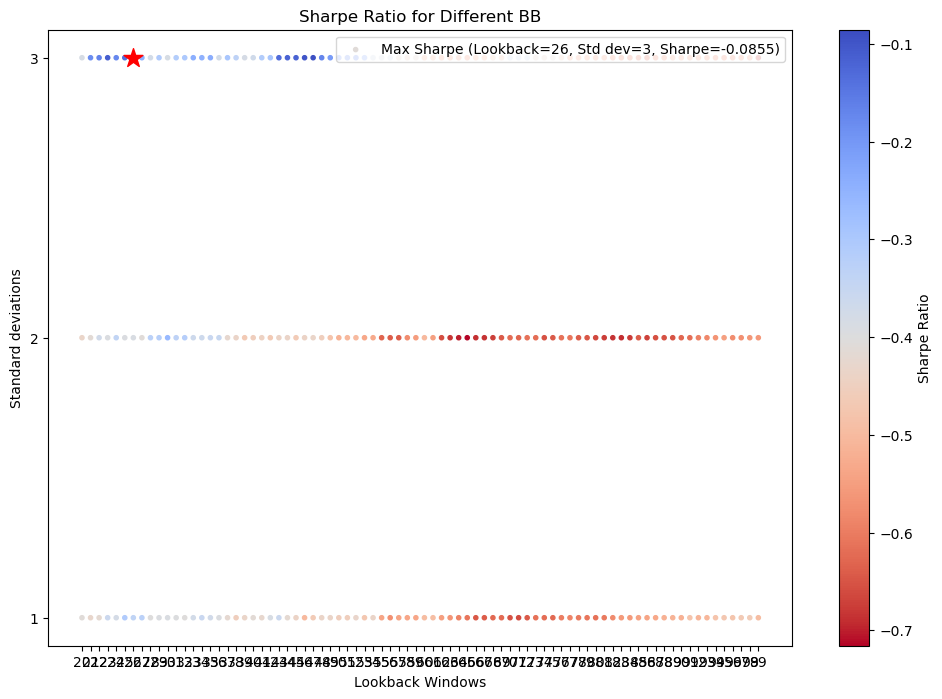

In [51]:
dfAAPLBB=BBStrategy(dfAAPL)

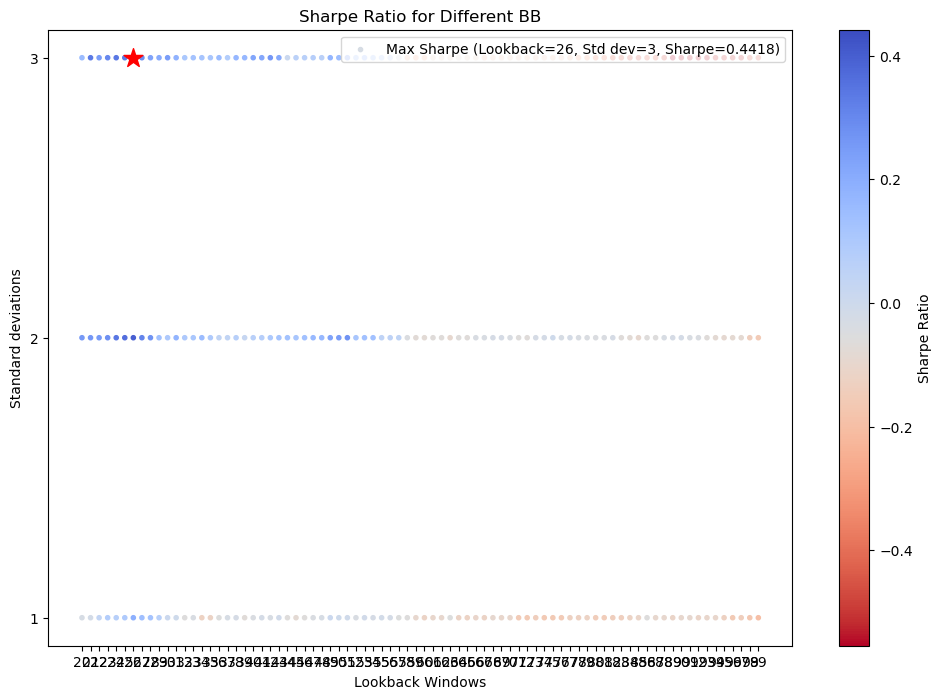

In [52]:
dfAMZNBB=BBStrategy(dfAMZN)

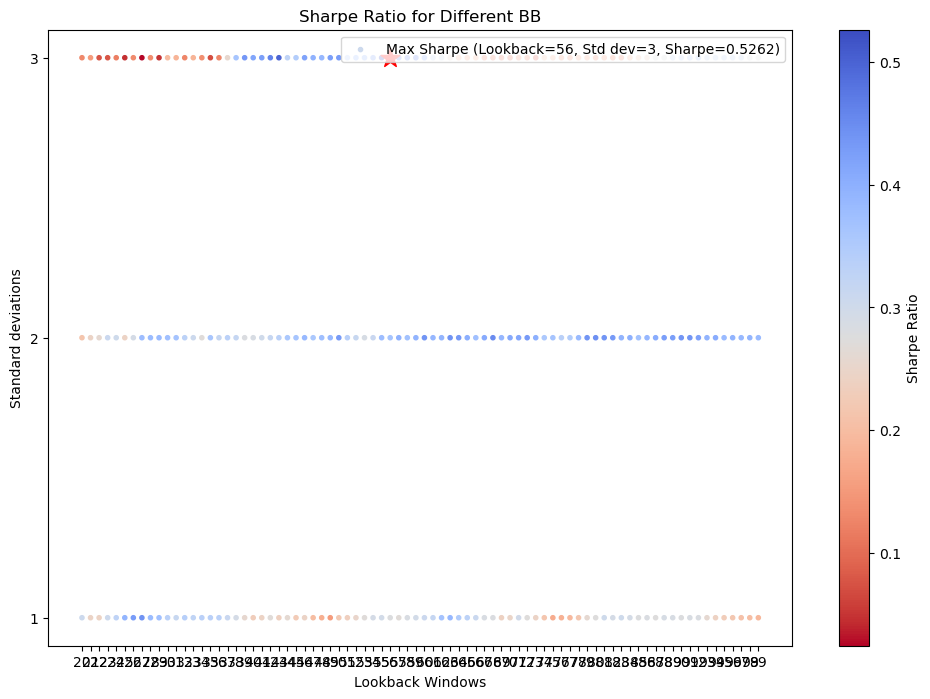

In [53]:
dfATTBB=BBStrategy(dfATT)

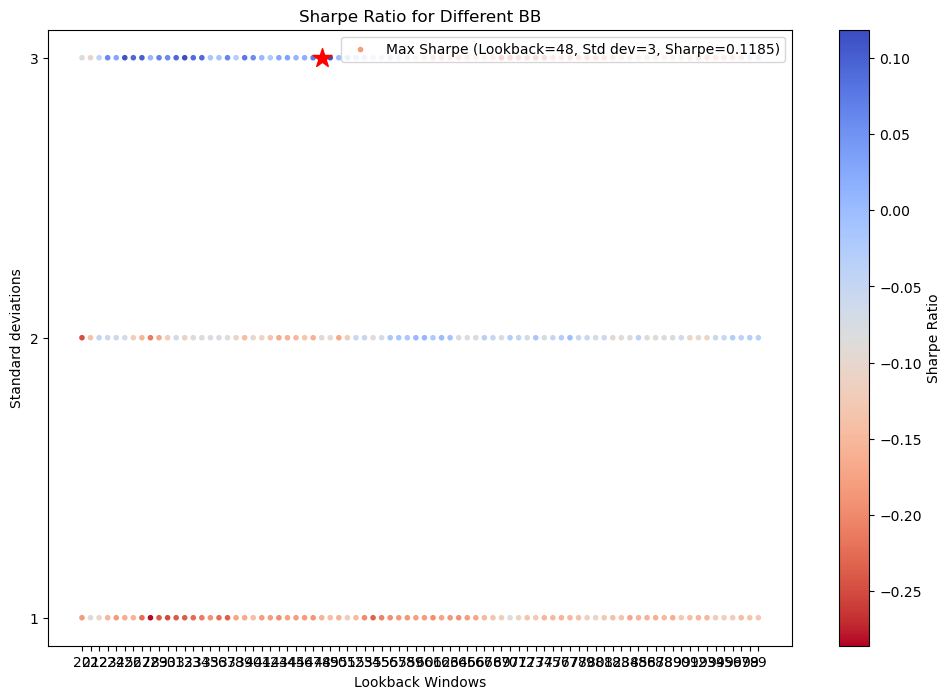

In [54]:
dfGEBB=BBStrategy(dfGE)

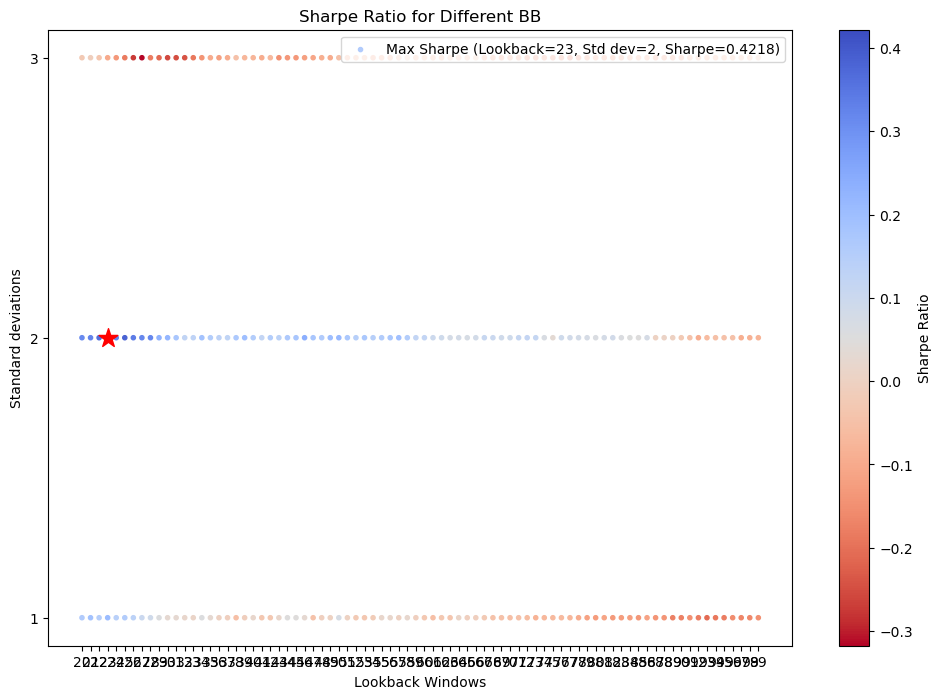

In [55]:
dfINTCBB=BBStrategy(dfINTC)

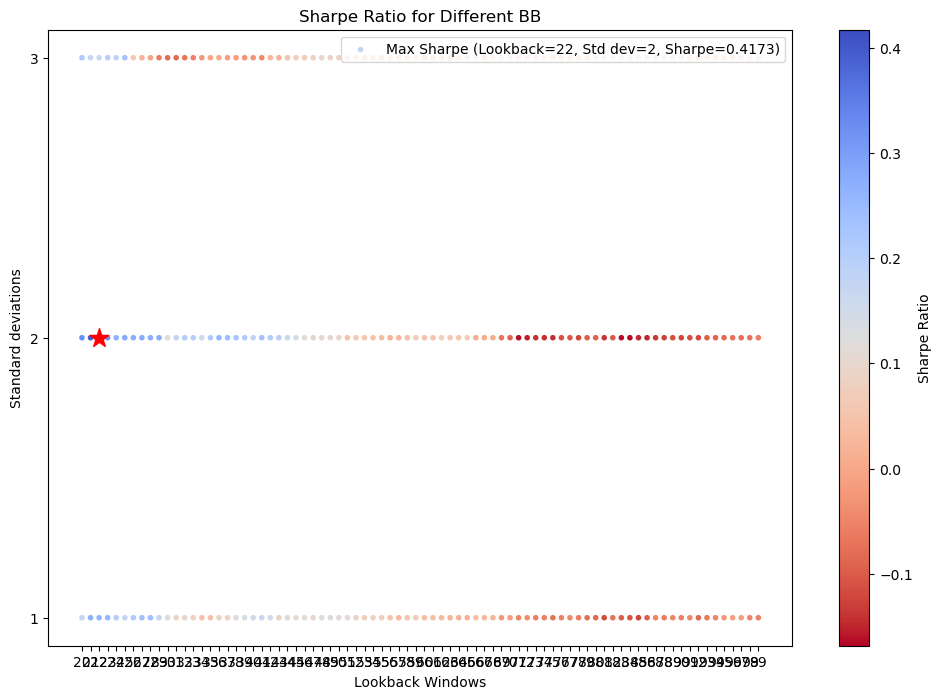

In [56]:
dfSPYBB=BBStrategy(dfSPY)

In [57]:
BBdfs=[dfAAPLBB,dfAMZNBB,dfATTBB,dfGEBB,dfINTCBB,dfSPYBB]
all_combinations_bb = []
for k in range(1, 6):  # Choose 1 to 5 tables
    combos = list(itertools.combinations(BBdfs, k))
    all_combinations_bb.extend(combos)
# Apply merge to all combinations
merged_tables_bb = [merge_combination(combo) for combo in all_combinations_bb]

# Normalize all merged tables
normalized_tables_bb = [min_max_normalize(df) for df in merged_tables_bb]
# Apply the function to all normalized tables
final_tables_bb = [add_sum_column(df) for df in normalized_tables_bb]
# Apply the function to all final tables and store in a list
max_values_list_bb = [find_max_index(df) for df in final_tables_bb]

# Option 1: Create a DataFrame with the results
max_values_df_bb = pd.DataFrame(
    [{'Max Index': entry['Max Index'], 'Value':entry['Value'],'Portfolio':entry['Portfolio']} for entry in max_values_list_bb]
)
max_values_df_bb

,Max Index,Value,Portfolio
0,"(26, 3)",1.000000,AAPL-BB
1,"(26, 3)",1.000000,AMZN-BB
2,"(56, 3)",1.000000,ATT-BB
3,"(48, 3)",1.000000,GE-BB
4,"(23, 2)",1.000000,INTC-BB
...,...,...,...
57,"(49, 3)",0.750499,AAPL-BB_AMZN-BB_ATT-BB_GE-BB_SPY-BB
58,"(28, 2)",0.754001,AAPL-BB_AMZN-BB_ATT-BB_INTC-BB_SPY-BB
59,"(22, 2)",0.774653,AAPL-BB_AMZN-BB_GE-BB_INTC-BB_SPY-BB
60,"(22, 2)",0.706224,AAPL-BB_ATT-BB_GE-BB_INTC-BB_SPY-BB


In [58]:
def retrive_sharpe_BB(row):
    lookback,stddev=row['Max Index']
    portfolio=row['Portfolio'].split('_')
    portfolioList=dfPrices.copy().drop(columns=dfPrices.copy().columns)
    for eq in portfolio:
        equity=eq.split('-BB')[0]
        df=dfPrices[[equity]].copy()
        portfolioList.loc[:,eq]=bollingerBands(df,lookback,stddev)[eq]
        
    portfolioList=portfolioList.dropna()
    portfolioReturns=generatePortfolio(portfolioList,wts=None)['Portfolio'].to_frame()                      
    return calcPerformanceStatistics(portfolioReturns,print_Screen=False).loc[:,'Sharpe Ratio']['Portfolio']
  

In [59]:
max_values_df_bb['Sharpe']=max_values_df_bb.apply(retrive_sharpe_BB, axis=1)
max_values_df_bb

,Max Index,Value,Portfolio,Sharpe
0,"(26, 3)",1.000000,AAPL-BB,-0.085470
1,"(26, 3)",1.000000,AMZN-BB,0.441757
2,"(56, 3)",1.000000,ATT-BB,0.526159
3,"(48, 3)",1.000000,GE-BB,0.118548
4,"(23, 2)",1.000000,INTC-BB,0.421807
...,...,...,...,...
57,"(49, 3)",0.750499,AAPL-BB_AMZN-BB_ATT-BB_GE-BB_SPY-BB,0.149469
58,"(28, 2)",0.754001,AAPL-BB_AMZN-BB_ATT-BB_INTC-BB_SPY-BB,0.259928
59,"(22, 2)",0.774653,AAPL-BB_AMZN-BB_GE-BB_INTC-BB_SPY-BB,0.138854
60,"(22, 2)",0.706224,AAPL-BB_ATT-BB_GE-BB_INTC-BB_SPY-BB,0.098745


In [60]:
max_values_df_bb.sort_values(by='Sharpe').tail(20)

,Max Index,Value,Portfolio,Sharpe
14,"(22, 2)",0.904936,AMZN-BB_SPY-BB,0.354808
35,"(25, 3)",0.852741,AMZN-BB_GE-BB_SPY-BB,0.362458
34,"(25, 2)",0.802854,AMZN-BB_GE-BB_INTC-BB,0.362595
11,"(43, 3)",0.858264,AMZN-BB_ATT-BB,0.371657
51,"(23, 2)",0.742566,AMZN-BB_ATT-BB_GE-BB_INTC-BB,0.394423
12,"(26, 3)",0.968827,AMZN-BB_GE-BB,0.394589
61,"(23, 2)",0.760848,AMZN-BB_ATT-BB_GE-BB_INTC-BB_SPY-BB,0.407934
5,"(22, 2)",1.000000,SPY-BB,0.417294
4,"(23, 2)",1.000000,INTC-BB,0.421807
17,"(27, 1)",0.764618,ATT-BB_SPY-BB,0.431960


### Stock selection based on correlation matrix -

In [61]:
# Normalizing the securites to start them of on equal footing
dfCompareNorm = dfPrices[stocks_list].copy()
dfCompareNorm['AAPL'] = dfPrices['AAPL'] / dfPrices['AAPL'].iloc[0]
dfCompareNorm['AMZN'] = dfPrices['AMZN'] / dfPrices['AMZN'].iloc[0]
dfCompareNorm['INTC'] = dfPrices['INTC'] / dfPrices['INTC'].iloc[0]
dfCompareNorm['GE'] = dfPrices['GE'] / dfPrices['GE'].iloc[0]
dfCompareNorm['SPY'] = dfPrices['SPY'] / dfPrices['SPY'].iloc[0]
dfCompareNorm['ATT'] = dfPrices['ATT'] / dfPrices['ATT'].iloc[0]
dfCompareNorm

,AAPL,AMZN,ATT,GE,INTC,SPY
1999-12-31,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2000-01-03,1.088754,1.174056,0.964102,0.969305,1.056948,0.990213
2000-01-04,0.996961,1.076355,0.907692,0.930533,1.007593,0.951489
2000-01-05,1.011549,0.916256,0.921795,0.928918,1.015945,0.953191
2000-01-06,0.924012,0.861248,0.897436,0.941337,0.956720,0.937872
...,...,...,...,...,...,...
2018-12-24,39.987734,17.654646,0.561231,0.134152,1.059134,1.595506
2018-12-26,42.803733,19.322167,0.576000,0.143263,1.122308,1.676119
2018-12-27,42.525944,19.200526,0.577436,0.140937,1.126439,1.688987
2018-12-28,42.547732,19.415698,0.583795,0.145590,1.135915,1.686809


In [62]:
logReturns = np.log(dfCompareNorm / dfCompareNorm.shift(1))
print(logReturns.isnull().sum())
logReturns

AAPL    1
AMZN    1
ATT     1
GE      1
INTC    1
SPY     1
dtype: int64


,AAPL,AMZN,ATT,GE,INTC,SPY
1999-12-31,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,0.085034,0.160464,-0.036558,-0.031176,0.055385,-0.009835
2000-01-04,-0.088077,-0.086884,-0.060292,-0.040822,-0.047821,-0.039891
2000-01-05,0.014527,-0.161039,0.015417,-0.001738,0.008255,0.001787
2000-01-06,-0.090514,-0.061914,-0.026781,0.013281,-0.060064,-0.016202
...,...,...,...,...,...,...
2018-12-24,-0.026215,-0.024613,-0.034133,-0.032697,-0.028273,-0.026778
2018-12-26,0.068053,0.090254,0.025975,0.065712,0.057936,0.049290
2018-12-27,-0.006511,-0.006315,0.002490,-0.016371,0.003674,0.007648
2018-12-28,0.000512,0.011144,0.010952,0.032479,0.008377,-0.001291


In [63]:
# Calculate the correlation matrix
correlation_matrix = logReturns.dropna().corr()

# Display the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

Correlation Matrix:
          AAPL      AMZN       ATT        GE      INTC       SPY
AAPL  1.000000  0.329348  0.244578  0.340593  0.469609  0.493349
AMZN  0.329348  1.000000  0.181988  0.296494  0.383254  0.465617
ATT   0.244578  0.181988  1.000000  0.382980  0.326803  0.563751
GE    0.340593  0.296494  0.382980  1.000000  0.424948  0.696264
INTC  0.469609  0.383254  0.326803  0.424948  1.000000  0.641516
SPY   0.493349  0.465617  0.563751  0.696264  0.641516  1.000000


## Master DataFrame

In [64]:
maFast = 21
maSlow = 235
bbWindow = 56
bbStdevBand = 3

# Dictionary to store the results
results_dict = {}

# Loop through each instrument and apply the runMovingAverageAndBB function
for instrument in instrument_list:
    df_instrument = dfPrices[instrument].to_frame()  # Extract the price data for the instrument
    result = runMovingAverageAndBB(df_instrument, maFast, maSlow, bbWindow, bbStdevBand)
    
    # Store the result in the dictionary
    results_dict[instrument] = result

# Now, we need to combine all the results into a single DataFrame with 60 columns
master_df = pd.concat([results_dict[instrument] for instrument in instrument_list], axis=1, join='inner')

In [65]:
master_df

,AAPL-BMK-MA,AAPL-MAFlat,AAPL-MAShort,AAPL-BMK-BB,AAPL-BB,AMZN-BMK-MA,AMZN-MAFlat,AMZN-MAShort,AMZN-BMK-BB,AMZN-BB,...,AUD-BMK-MA,AUD-MAFlat,AUD-MAShort,AUD-BMK-BB,AUD-BB,EUR-BMK-MA,EUR-MAFlat,EUR-MAShort,EUR-BMK-BB,EUR-BB
2000-12-05,NaN,NaN,NaN,0.018552,0.018552,NaN,NaN,NaN,-0.045736,-0.0,...,NaN,NaN,NaN,-0.007204,-0.0,NaN,NaN,NaN,-0.006570,-0.0
2000-12-06,-0.172080,-0.0,0.172080,-0.172080,-0.172080,-0.071459,-0.0,0.071459,-0.071459,-0.0,...,0.017094,0.0,-0.017094,0.017094,0.0,0.013658,0.0,-0.013658,0.013658,0.0
2000-12-07,0.000000,0.0,-0.000000,0.000000,0.000000,-0.100083,-0.0,0.100083,-0.100083,-0.0,...,-0.003652,-0.0,0.003652,-0.003652,-0.0,-0.003931,-0.0,0.003931,-0.003931,-0.0
2000-12-08,0.051076,0.0,-0.051076,0.051076,0.051076,0.092115,0.0,-0.092115,0.092115,0.0,...,0.003834,0.0,-0.003834,0.003834,0.0,0.000338,0.0,-0.000338,0.000338,0.0
2000-12-11,0.008264,0.0,-0.008264,0.008264,0.008264,0.076961,0.0,-0.076961,0.076961,0.0,...,-0.014315,-0.0,0.014315,-0.014315,-0.0,-0.011884,-0.0,0.011884,-0.011884,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,-0.026215,-0.0,0.026215,-0.026215,-0.026215,-0.024613,-0.0,0.024613,-0.024613,-0.0,...,0.001278,0.0,-0.001278,0.001278,0.0,0.002985,0.0,-0.002985,0.002985,0.0
2018-12-26,0.068053,0.0,-0.068053,0.068053,0.068053,0.090254,0.0,-0.090254,0.090254,0.0,...,0.002409,0.0,-0.002409,0.002409,0.0,-0.004658,-0.0,0.004658,-0.004658,-0.0
2018-12-27,-0.006511,-0.0,0.006511,-0.006511,-0.006511,-0.006315,-0.0,0.006315,-0.006315,-0.0,...,-0.004681,-0.0,0.004681,-0.004681,-0.0,0.006759,0.0,-0.006759,0.006759,0.0
2018-12-28,0.000512,0.0,-0.000512,0.000512,0.000512,0.011144,0.0,-0.011144,0.011144,0.0,...,0.001989,0.0,-0.001989,0.001989,0.0,0.001224,0.0,-0.001224,0.001224,0.0


## myStrategies DataFrame 

In [66]:
chosen_strategies = ['AAPL-MAFlat', 'AMZN-MAFlat', 'ATT-BB', 'EUR-BB', 
                     'GE-MAShort', 'LEHM-BMK-MA', 'SILVER-MAShort', 'SPY-MAFlat']

# Subset master_df to include only these 8 strategies
myStrategies = master_df[chosen_strategies]

# Sort the strategies alphabetically by column names
myStrategies = myStrategies.reindex(sorted(myStrategies.columns), axis=1)

In [67]:
myStrategies

,AAPL-MAFlat,AMZN-MAFlat,ATT-BB,EUR-BB,GE-MAShort,LEHM-BMK-MA,SILVER-MAShort,SPY-MAFlat
2000-12-05,NaN,NaN,0.000000,-0.0,NaN,NaN,NaN,NaN
2000-12-06,-0.0,-0.0,0.000000,0.0,0.003470,0.004519,-0.008439,-0.0
2000-12-07,0.0,-0.0,0.000000,-0.0,0.008144,0.000619,0.004211,-0.0
2000-12-08,0.0,0.0,-0.000000,0.0,-0.031055,-0.001282,0.017022,0.0
2000-12-11,0.0,0.0,-0.000000,-0.0,-0.002262,-0.000261,-0.002144,0.0
...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.034133,0.0,0.032697,0.001688,-0.008298,-0.0
2018-12-26,0.0,0.0,0.025975,-0.0,-0.065712,-0.002511,-0.017478,0.0
2018-12-27,-0.0,-0.0,0.002490,0.0,0.016371,0.002101,-0.012689,0.0
2018-12-28,0.0,0.0,0.010952,0.0,-0.032479,0.000285,-0.010219,-0.0


In [68]:
# Creating Correlation matrix for chosen strategies
correlation_matrix = myStrategies.corr()
correlation_matrix

,AAPL-MAFlat,AMZN-MAFlat,ATT-BB,EUR-BB,GE-MAShort,LEHM-BMK-MA,SILVER-MAShort,SPY-MAFlat
AAPL-MAFlat,1.000000,0.263722,0.046994,0.047275,-0.016137,-0.120998,0.028773,0.399322
AMZN-MAFlat,0.263722,1.000000,0.027474,0.072447,-0.048057,-0.132623,0.027667,0.341753
ATT-BB,0.046994,0.027474,1.000000,0.126830,-0.109338,-0.022393,-0.065261,0.065530
EUR-BB,0.047275,0.072447,0.126830,1.000000,-0.089630,-0.107019,-0.174518,0.071653
GE-MAShort,-0.016137,-0.048057,-0.109338,-0.089630,1.000000,0.089319,0.046791,0.171644
LEHM-BMK-MA,-0.120998,-0.132623,-0.022393,-0.107019,0.089319,1.000000,0.007527,-0.172276
SILVER-MAShort,0.028773,0.027667,-0.065261,-0.174518,0.046791,0.007527,1.000000,0.063324
SPY-MAFlat,0.399322,0.341753,0.065530,0.071653,0.171644,-0.172276,0.063324,1.000000


## Equal weights sharpe ratio

In [69]:
# Calculate the daily returns of the equal-weighted portfolio
equal_weights = np.ones(len(myStrategies.columns)) / len(myStrategies.columns)  # Equal weights

# Portfolio daily returns using dot product
portfolio_returns = myStrategies.dot(equal_weights)

annualized_return = portfolio_returns.mean() * 260
annualized_std = portfolio_returns.std() * np.sqrt(260)

# Assuming a risk-free rate of 0, calculate the Sharpe ratio
sharpe_ratio = annualized_return / annualized_std          

# Output the Sharpe ratio
print(f"Annualized Sharpe Ratio of Equal-Weighted Portfolio: {sharpe_ratio:.4f}")                            

Annualized Sharpe Ratio of Equal-Weighted Portfolio: 1.0711


In [70]:
myStrategiesCopy = myStrategies.copy()

               Max Sharpe Portfolio Weights
AAPL-MAFlat                           9.47%
AMZN-MAFlat                           8.47%
ATT-BB                               27.96%
EUR-BB                                1.98%
GE-MAShort                            8.57%
LEHM-BMK-MA                          29.84%
SILVER-MAShort                        1.73%
SPY-MAFlat                           11.97%


,AAPL-MAFlat,AMZN-MAFlat,ATT-BB,EUR-BB,GE-MAShort,LEHM-BMK-MA,SILVER-MAShort,SPY-MAFlat,Portfolio
2000-12-05,NaN,NaN,0.000000,-0.0,NaN,NaN,NaN,NaN,0.000000
2000-12-06,-0.0,-0.0,0.000000,0.0,0.003470,0.004519,-0.008439,-0.0,-0.000056
2000-12-07,0.0,-0.0,0.000000,-0.0,0.008144,0.000619,0.004211,-0.0,0.001622
2000-12-08,0.0,0.0,-0.000000,0.0,-0.031055,-0.001282,0.017022,0.0,-0.001914
2000-12-11,0.0,0.0,-0.000000,-0.0,-0.002262,-0.000261,-0.002144,0.0,-0.000583
...,...,...,...,...,...,...,...,...,...
2018-12-24,-0.0,-0.0,-0.034133,0.0,0.032697,0.001688,-0.008298,-0.0,-0.001006
2018-12-26,0.0,0.0,0.025975,-0.0,-0.065712,-0.002511,-0.017478,0.0,-0.007466
2018-12-27,-0.0,-0.0,0.002490,0.0,0.016371,0.002101,-0.012689,0.0,0.001034
2018-12-28,0.0,0.0,0.010952,0.0,-0.032479,0.000285,-0.010219,-0.0,-0.003933


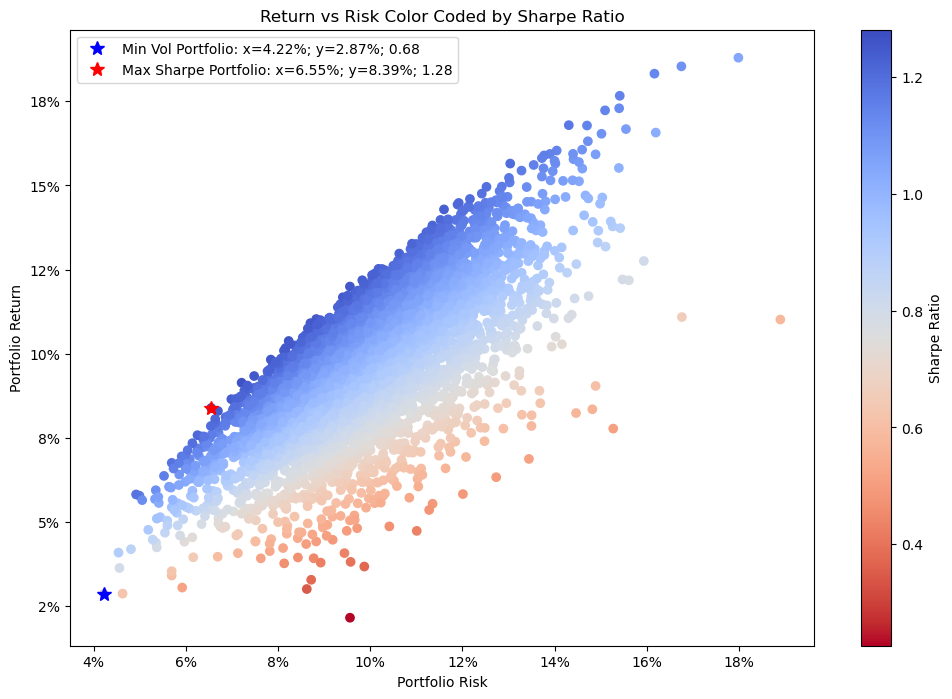

In [71]:
# 5,000-step Monte Carlo simulation with a seed of 64
WeightedmyStrategies=monteCarlo(myStrategiesCopy)
WeightedmyStrategies

- The maximum Sharpe ratio of 1.28 obtained from the Monte Carlo simulation which is higher than the equal-weighted Sharpe ratio of 1.07. This indicates that the optimized portfolio found through the simulation offers better risk-adjusted returns compared to the equal-weighted portfolio.

In [72]:
# The weights for the maximum Sharpe portfolio
max_sharpe_weights = np.array([0.0947, 0.0847, 0.2796, 0.0198, 0.0857, 0.2984, 0.0173, 0.1197])

# Calculate the daily returns of the maximum Sharpe portfolio
# Multiply the individual strategy returns by their respective weights
max_sharpe_portfolio_returns = myStrategies.dot(max_sharpe_weights)

# 3. Add this as the 9th column to the myStrategies DataFrame
myStrategies['Max Sharpe Portfolio'] = max_sharpe_portfolio_returns


In [73]:
calcPerformanceStatistics(myStrategies)

,Annual Return,Annualized Risk,Sharpe Ratio,Max Drawdown,Success Ratio
AAPL-MAFlat,0.260721,0.279989,0.931180,-0.477642,0.391574
AMZN-MAFlat,0.211058,0.332535,0.634695,-0.371905,0.360976
ATT-BB,0.058876,0.109739,0.536508,-0.100163,0.075831
EUR-BB,-0.008492,0.046169,-0.183922,-0.320475,0.076940
GE-MAShort,0.162729,0.310463,0.524151,-0.296190,0.502439
LEHM-BMK-MA,0.009523,0.037530,0.253743,-0.110523,0.523725
SILVER-MAShort,0.009841,0.310963,0.031647,-0.717759,0.508869
SPY-MAFlat,0.067345,0.110630,0.608738,-0.119462,0.379157
Max Sharpe Portfolio,0.083879,0.065472,1.281152,-0.051817,0.546785


The Max Sharpe Portfolio demonstrates superior performance compared to the individual components in several key metrics:

- **Annual Return:** The Max Sharpe Portfolio achieves an annual return of 8.39%, which is lower than some individual strategies (like AAPL-MAFlat at 26.07% and AMZN-MAFlat at 21.11%), but it balances return with risk far more effectively.

- **Annualized Risk:** With an annualized risk (volatility) of 6.55%, the Max Sharpe Portfolio exhibits significantly lower risk than most individual strategies, including high-risk strategies like AMZN-MAFlat (33.25%) and SILVER-MAShort (31.10%).

- **Sharpe Ratio:** The Sharpe Ratio of 1.28 for the Max Sharpe Portfolio is the highest among all strategies, indicating the best risk-adjusted return. No individual strategy comes close to this performance; for example, AAPL-MAFlat, the highest individual strategy, has a Sharpe ratio of 0.93.

- **Max Drawdown:** The Max Sharpe Portfolio experiences the lowest maximum drawdown at -5.18%, significantly better than individual strategies like SILVER-MAShort (-71.78%) and AAPL-MAFlat (-47.76%).

- **Success Ratio:** The Success Ratio of the Max Sharpe Portfolio is 0.546785, indicating it outperforms 54.68% of the time. This is one of the highest success ratios in the table, outperforming most individual strategies, such as AMZN-MAFlat (36.10%) and ATT-BB (7.58%).

In [74]:
instruments = ['AAPL', 'AMZN', 'ATT', 'EUR', 'GE', 'LEHM', 'SILVER', 'SPY']

# Define the strategy columns for each portfolio variation
bmk_columns = [f'{instrument}-BMK-MA' for instrument in instruments]
maflat_columns = [f'{instrument}-MAFlat' for instrument in instruments]
mashort_columns = [f'{instrument}-MAShort' for instrument in instruments]
bb_columns = [f'{instrument}-BB' for instrument in instruments]  # Assuming '-BB' exists for Bollinger Bands

# 2. Define a function to calculate the Sharpe ratio for a given strategy portfolio
def calculate_sharpe(strategy_columns, portfolio_name):
    # Subset the master DataFrame to the chosen strategy columns
    portfolio_df = master_df[strategy_columns]
    
    # Calculate equal-weighted portfolio returns
    equal_weights = np.ones(len(strategy_columns)) / len(strategy_columns)  # Equal weights
    portfolio_returns = portfolio_df.dot(equal_weights)
    
    # Calculate mean and std of daily returns
    mean_daily_return = portfolio_returns.mean()
    std_daily_return = portfolio_returns.std()
    
    # Annualize the mean and std
    annualized_return = mean_daily_return * 260
    annualized_std = std_daily_return * np.sqrt(260)
    
    # Calculate Sharpe ratio (assuming risk-free rate of 0)
    sharpe_ratio = annualized_return / annualized_std
    
    # Print and return the Sharpe ratio
    print(f"Sharpe Ratio for {portfolio_name}: {sharpe_ratio:.4f}")
    return sharpe_ratio

# 3. Calculate Sharpe ratios for each portfolio variation
sharpe_bmk = calculate_sharpe(bmk_columns, 'BMK-only Portfolio')
sharpe_maflat = calculate_sharpe(maflat_columns, 'MAFlat Strategy Portfolio')
sharpe_mashort = calculate_sharpe(mashort_columns, 'MAShort Strategy Portfolio')
sharpe_bb = calculate_sharpe(bb_columns, 'Bollinger Bands Portfolio')

# Compare the results to see which portfolio performs better in terms of Sharpe ratio
sharpe_ratios = {
    'BMK-only': sharpe_bmk,
    'MAFlat': sharpe_maflat,
    'MAShort': sharpe_mashort,
    'Bollinger Bands': sharpe_bb
}

Sharpe Ratio for BMK-only Portfolio: 0.3918
Sharpe Ratio for MAFlat Strategy Portfolio: 0.8355
Sharpe Ratio for MAShort Strategy Portfolio: 0.6594
Sharpe Ratio for Bollinger Bands Portfolio: -0.0340


## Comparison of Portfolio Variations: Benchmarks, MAFlat, MAShort, and Bollinger Bands Strategies

- None of the four portfolios (BMK-only, MAFlat, MAShort, or Bollinger Bands) outperform the **chosen maximum Sharpe portfolio**, which has a Sharpe ratio of **1.28**.
- The highest Sharpe ratio among the four portfolios is 0.8355 for the MAFlat strategy, but it is still lower than the maximum Sharpe ratio obtained from the Monte Carlo simulation.

### Beta Calculation: Max Sharpe Portfolio v/s SPY-BMK-MA

In [75]:
# We firstly set up the dependent variable
y = max_sharpe_portfolio_returns.dropna()
y

2000-12-06    0.001500
2000-12-07    0.000956
2000-12-08   -0.002749
2000-12-11   -0.000309
2000-12-12    0.004066
                ...   
2018-12-24   -0.006381
2018-12-26    0.000580
2018-12-27    0.002507
2018-12-28    0.000187
2018-12-31    0.000669
Length: 4510, dtype: float64

In [76]:
y.columns = ['MaxSharpe']
y

2000-12-06    0.001500
2000-12-07    0.000956
2000-12-08   -0.002749
2000-12-11   -0.000309
2000-12-12    0.004066
                ...   
2018-12-24   -0.006381
2018-12-26    0.000580
2018-12-27    0.002507
2018-12-28    0.000187
2018-12-31    0.000669
Length: 4510, dtype: float64

In [77]:
# Remove the first NaN row
X = master_df.dropna()['SPY-BMK-MA']

In [78]:
X = sm.add_constant(X)

In [79]:
X

,const,SPY-BMK-MA
2000-12-06,1.0,-0.016127
2000-12-07,1.0,-0.013816
2000-12-08,1.0,0.002335
2000-12-11,1.0,0.034166
2000-12-12,1.0,-0.004292
...,...,...
2018-12-24,1.0,-0.026778
2018-12-26,1.0,0.049290
2018-12-27,1.0,0.007648
2018-12-28,1.0,-0.001291


In [80]:
# note that the 'x' variable (or independent variable) needs to be specified as a matrix which COULD have multiple columns
# in our case, we have only independent variable + the constant alpha term
max_sharpe_SPY_BMK_MA_Reg = sm.OLS(y, X)

In [81]:
# Then we actually fit the data in the OLS regression object
max_sharpe_SPY_BMK_MA_Reg = max_sharpe_SPY_BMK_MA_Reg.fit()

In [82]:
print(max_sharpe_SPY_BMK_MA_Reg.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.122
Model:                            OLS   Adj. R-squared:                  0.121
Method:                 Least Squares   F-statistic:                     623.8
Date:                Mon, 14 Oct 2024   Prob (F-statistic):          4.64e-129
Time:                        15:16:56   Log-Likelihood:                 18728.
No. Observations:                4510   AIC:                        -3.745e+04
Df Residuals:                    4508   BIC:                        -3.744e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0003   5.67e-05      5.417      0.0

##### Beta is basically the coefficient of the variables

In [83]:
max_sharpe_SPY_BMK_MA_Reg.params

const         0.000307
SPY-BMK-MA    0.117858
dtype: float64


## This basically means that for every 1-unit move for the SPY our max sharpe portfolio moves 0.1179 units i.e it is LESS volatile than the overall market.

We pledge on our honor that we have not given nor received any unauthorized assistance on this
assignment to/from other groups. Nor have we received any assistance from prior year students."
- Aashay Zanpure
- Stuti Shrimal
- Tirth Shah
- Vineet Chheda